# [Regression task] - House Price Prediction 

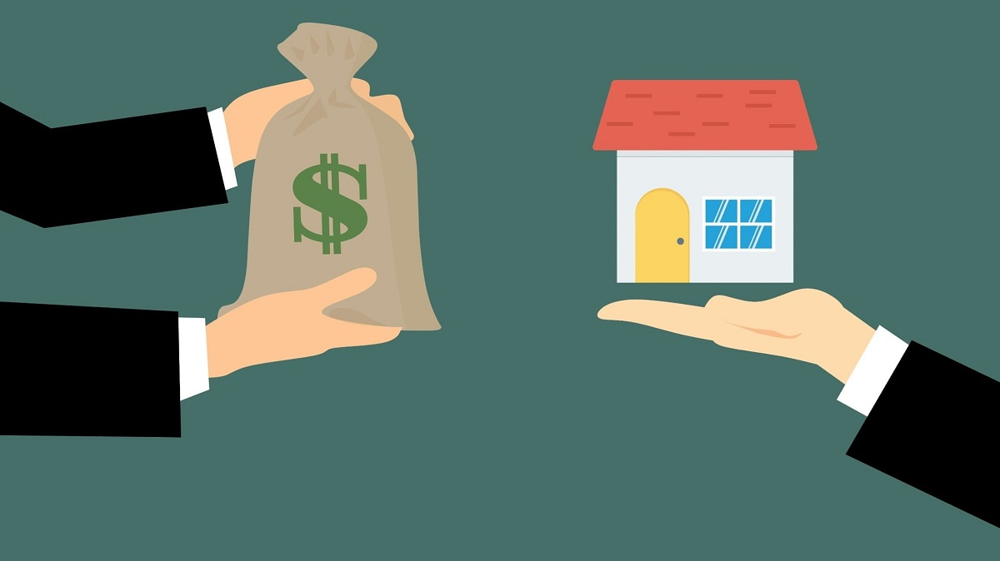

## Description
A simple yet challenging project, to predict the housing price based on certain factors like house area, bedrooms, furnished, nearness to mainroad, etc. The dataset is small yet, it's complexity arises due to the fact that it has strong multicollinearity. 

## Acknowledgement
Harrison, D. and Rubinfeld, D.L. (1978) Hedonic prices and the demand for clean air. J. Environ. Economics and Management 5, 81–102.
Belsley D.A., Kuh, E. and Welsch, R.E. (1980) Regression Diagnostics. Identifying Influential Data and Sources of Collinearity. New York: Wiley.

## Objective
- Understand the Dataset & cleanup.
- Feature Engineering and Data Processing: process of using raw data to create features that will be used for predictive modeling.
- Build Regression models to predict the sales w.r.t a single & multiple feature.
- Evaluate the models & compare thier respective scores like R2, RMSE.

## Research process

Worked 30 hours for 3 weeks as a data scientist and developed regression models and evaluated results. Data Analysis included using different analysing techniques, fact-checking, extracting new data, patterns & data visualisation,feature engineering, building pipelines and final evaluation & reporting.

## Dataset Attribution 

- SalePrice - the property's sale price in dollars. This is the target variable that you're trying to predict.
- MSSubClass: The building class
- MSZoning: The general zoning classification
- LotFrontage: Linear feet of street connected to property
- LotArea: Lot size in square feet
- Street: Type of road access
- Alley: Type of alley access
- LotShape: General shape of property
- LandContour: Flatness of the property
- Utilities: Type of utilities available
- LotConfig: Lot configuration
- LandSlope: Slope of property
- Neighborhood: Physical locations within Ames city limits
- Condition1: Proximity to main road or railroad
- Condition2: Proximity to main road or railroad (if a second is present)
- BldgType: Type of dwelling
- HouseStyle: Style of dwelling
- OverallQual: Overall material and finish quality
- OverallCond: Overall condition rating
- YearBuilt: Original construction date
- YearRemodAdd: Remodel date
- RoofStyle: Type of roof
- RoofMatl: Roof material
- Exterior1st: Exterior covering on house
- Exterior2nd: Exterior covering on house (if more than one material)
- MasVnrType: Masonry veneer type
- MasVnrArea: Masonry veneer area in square feet
- ExterQual: Exterior material quality
- ExterCond: Present condition of the material on the exterior
- Foundation: Type of foundation
- BsmtQual: Height of the basement
- BsmtCond: General condition of the basement
- BsmtExposure: Walkout or garden level basement walls
- BsmtFinType1: Quality of basement finished area
- BsmtFinSF1: Type 1 finished square feet
- BsmtFinType2: Quality of second finished area (if present)
- BsmtFinSF2: Type 2 finished square feet
- BsmtUnfSF: Unfinished square feet of basement area
- TotalBsmtSF: Total square feet of basement area
- Heating: Type of heating
- HeatingQC: Heating quality and condition
- CentralAir: Central air conditioning
- Electrical: Electrical system
- 1stFlrSF: First Floor square feet
- 2ndFlrSF: Second floor square feet
- LowQualFinSF: Low quality finished square feet (all floors)
- GrLivArea: Above grade (ground) living area square feet
- BsmtFullBath: Basement full bathrooms
- BsmtHalfBath: Basement half bathrooms
- FullBath: Full bathrooms above grade
- HalfBath: Half baths above grade
- Bedroom: Number of bedrooms above basement level
- Kitchen: Number of kitchens
- KitchenQual: Kitchen quality
- TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)
- Functional: Home functionality rating
- Fireplaces: Number of fireplaces
- FireplaceQu: Fireplace quality
- GarageType: Garage location
- GarageYrBlt: Year garage was built
- GarageFinish: Interior finish of the garage
- GarageCars: Size of garage in car capacity
- GarageArea: Size of garage in square feet
- GarageQual: Garage quality
- GarageCond: Garage condition
- PavedDrive: Paved driveway
- WoodDeckSF: Wood deck area in square feet
- OpenPorchSF: Open porch area in square feet
- EnclosedPorch: Enclosed porch area in square feet
- 3SsnPorch: Three season porch area in square feet
- ScreenPorch: Screen porch area in square feet
- PoolArea: Pool area in square feet
- PoolQC: Pool quality
- Fence: Fence quality
- MiscFeature: Miscellaneous feature not covered in other categories
- MiscVal: $Value of miscellaneous feature
- MoSold: Month Sold
- YrSold: Year Sold
- SaleType: Type of sale
- SaleCondition: Condition of sale

## 1. Import libraries

In [2]:
import pandas as pd
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt
import scipy.stats as stats

from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error as MSE, r2_score, roc_auc_score
from math import sqrt
from sklearn.model_selection import cross_val_score as RMSE 
from sklearn.ensemble import GradientBoostingClassifier
from feature_engine.imputation import MeanMedianImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso

from feature_engine.wrappers import SklearnTransformerWrapper
from feature_engine.encoding import OneHotEncoder, OrdinalEncoder, DecisionTreeEncoder
from feature_engine.encoding import WoEEncoder
from feature_engine.encoding import RareLabelEncoder
from feature_engine.imputation import RandomSampleImputer
from feature_engine.discretisation import EqualFrequencyDiscretiser, EqualWidthDiscretiser 
from feature_engine.encoding import CountFrequencyEncoder
from feature_engine.selection import DropConstantFeatures, DropDuplicateFeatures 
from feature_engine.selection import SmartCorrelatedSelection

from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split, GridSearchCV 

from xgboost import XGBRegressor
from mlens.visualization import corrmat
import plotly.express as px



C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
[MLENS] backend: threading


## 2. Define functions

In [4]:
# Show in DataFrame missing values with type of variable

def missing_value_info(data):
    nan_list = [var for var in data.columns if data[var].isnull().sum() > 0]
    info_na = data[nan_list].isnull().mean().round(3).sort_values(ascending = False).reset_index()
    info_na.columns = ['Columns','Nan_mean']
    info_na['Type'] = info_na.Columns.map(data.dtypes)
    info_na.Type = np.where(info_na.Type == 'O','Categorical', info_na.Type)
    info_na.Type = np.where(info_na.Type != 'Categorical','Numerical', info_na.Type)

    return info_na

# Visualizing in plot missing values
def missing_value_info_plot(data):    
    info = missing_value_info(data)
    plt.figure(figsize=(len(info.Columns) * 1.5, 2.5))
    plt.plot(info.Nan_mean,'b.-')
    plt.axhline(y = 0.5,color = 'red')
    plt.yticks(np.arange(0, 1.2, 0.2))
    plt.xticks(info.Columns.index,info.Columns,rotation = 90)
    plt.ylabel('Percentage of missing data')
    plt.grid()
    
    plt.show()

In [5]:
# Visualizing histogram, probability plot and box-plot

def diagnostic_plots(data, variable):
    fig = plt.figure()
    plt.figure(figsize = (18, 5))
   
    # Histogram
    plt.subplot(1, 3, 1)
    fig = data[variable].hist(bins = 30)
    fig.set_ylabel ('Number of houses')
    fig.set_xlabel(variable)
    
    # Probability plot
    plt.subplot(1, 3, 2)
    stats.probplot(data[variable], dist = 'norm', plot = plt)
    
    # Box-plot
    plt.subplot(1, 3, 3)
    fig = data.boxplot(column = variable)
    fig.set_title('Box-plot')
    fig.set_ylabel(variable)
    
    plt.tight_layout()
    plt.show()

In [6]:
# Check multicollinearity
def multicollinearity(data, threshold):
    
    col_corr = set()
    
    corr_matrix = data.corr().round(3)
    
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:
                print(abs(corr_matrix.iloc[i, j]), corr_matrix.columns[i], corr_matrix.columns[j])

## 3.  Download dataset

In [7]:
# Load dataset
data = pd.read_csv('../AI/houseprice.csv')

## 4. Exploratory data analysis (EDA)  

In [8]:
# Show first ten rows
data.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


In [9]:
# Show last ten rows
data.tail(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1450,1451,90,RL,60.0,9000,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2009,WD,Normal,136000
1451,1452,20,RL,78.0,9262,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2009,New,Partial,287090
1452,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2006,WD,Normal,145000
1453,1454,20,RL,90.0,17217,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2006,WD,Abnorml,84500
1454,1455,20,FV,62.0,7500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2009,WD,Normal,185000
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [10]:
# Get some basic info about studying dataset 
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [11]:
# Get some background information about mean, std, min and other estimators 
data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [12]:
# Checking basic background information including mean, std, min & max parameters 
data.describe().T.style.background_gradient(cmap = "viridis")

,count,mean,std,min,25%,50%,75%,max
Id,1460.000000,730.500000,421.610009,1.000000,365.750000,730.500000,1095.250000,1460.000000
MSSubClass,1460.000000,56.897260,42.300571,20.000000,20.000000,50.000000,70.000000,190.000000
LotFrontage,1201.000000,70.049958,24.284752,21.000000,59.000000,69.000000,80.000000,313.000000
LotArea,1460.000000,10516.828082,9981.264932,1300.000000,7553.500000,9478.500000,11601.500000,215245.000000
OverallQual,1460.000000,6.099315,1.382997,1.000000,5.000000,6.000000,7.000000,10.000000
OverallCond,1460.000000,5.575342,1.112799,1.000000,5.000000,5.000000,6.000000,9.000000
YearBuilt,1460.000000,1971.267808,30.202904,1872.000000,1954.000000,1973.000000,2000.000000,2010.000000
YearRemodAdd,1460.000000,1984.865753,20.645407,1950.000000,1967.000000,1994.000000,2004.000000,2010.000000
MasVnrArea,1452.000000,103.685262,181.066207,0.000000,0.000000,0.000000,166.000000,1600.000000
BsmtFinSF1,1460.000000,443.639726,456.098091,0.000000,0.000000,383.500000,712.250000,5644.000000


In [13]:
# Define categorical variables
categorical = [var for var in data.columns if data [var].dtype == 'O']
print('There are {} categorical variabls'.format(len(categorical)))

There are 43 categorical variabls


In [14]:
# Print categorical variables
print(data.select_dtypes(include = ['object']).columns.values)

['MSZoning' 'Street' 'Alley' 'LotShape' 'LandContour' 'Utilities'
 'LotConfig' 'LandSlope' 'Neighborhood' 'Condition1' 'Condition2'
 'BldgType' 'HouseStyle' 'RoofStyle' 'RoofMatl' 'Exterior1st'
 'Exterior2nd' 'MasVnrType' 'ExterQual' 'ExterCond' 'Foundation'
 'BsmtQual' 'BsmtCond' 'BsmtExposure' 'BsmtFinType1' 'BsmtFinType2'
 'Heating' 'HeatingQC' 'CentralAir' 'Electrical' 'KitchenQual'
 'Functional' 'FireplaceQu' 'GarageType' 'GarageFinish' 'GarageQual'
 'GarageCond' 'PavedDrive' 'PoolQC' 'Fence' 'MiscFeature' 'SaleType'
 'SaleCondition']


In [15]:
# Show first five categorical rows
data[categorical].head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,...,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal


In [16]:
# Define numerical variables
numerical = [var for var in data.columns if data[var].dtype !='O']
print('There are {} numerical variabls'.format(len(numerical)))

There are 38 numerical variabls


In [17]:
# Print numerical variables
print(data.select_dtypes(include = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']).columns.values)

['Id' 'MSSubClass' 'LotFrontage' 'LotArea' 'OverallQual' 'OverallCond'
 'YearBuilt' 'YearRemodAdd' 'MasVnrArea' 'BsmtFinSF1' 'BsmtFinSF2'
 'BsmtUnfSF' 'TotalBsmtSF' '1stFlrSF' '2ndFlrSF' 'LowQualFinSF'
 'GrLivArea' 'BsmtFullBath' 'BsmtHalfBath' 'FullBath' 'HalfBath'
 'BedroomAbvGr' 'KitchenAbvGr' 'TotRmsAbvGrd' 'Fireplaces' 'GarageYrBlt'
 'GarageCars' 'GarageArea' 'WoodDeckSF' 'OpenPorchSF' 'EnclosedPorch'
 '3SsnPorch' 'ScreenPorch' 'PoolArea' 'MiscVal' 'MoSold' 'YrSold'
 'SalePrice']


In [18]:
# Show first five numerical rows
data[numerical].head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,...,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,...,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,...,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,...,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,...,192,84,0,0,0,0,0,12,2008,250000


In [19]:
# define years related vaviables
year_vars = [var for var in numerical if 'Yr' in var or 'Year' in var]
print('There are {} Time format variabls'.format(len(year_vars)))


There are 4 Time format variabls


In [20]:
# show years variables
year_vars

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

In [21]:
# show years variables
data[year_vars].head()

,YearBuilt,YearRemodAdd,GarageYrBlt,YrSold
0,2003,2003,2003.0,2008
1,1976,1976,1976.0,2007
2,2001,2002,2001.0,2008
3,1915,1970,1998.0,2006
4,2000,2000,2000.0,2008


In [22]:
# Define discrete variables
discrete = [var for var in data.columns if data[var].dtype != 'O' 
            and var != 'SalePrice' and data[var].nunique() < 20]
print('Number of discrete variables in the dataset: ', len(discrete))

Number of discrete variables in the dataset:  15


In [23]:
# show discrete variables
data[discrete].columns.values

array(['MSSubClass', 'OverallQual', 'OverallCond', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars',
       'PoolArea', 'MoSold', 'YrSold'], dtype=object)

In [24]:
# show discrete variables
data[discrete].head()

,MSSubClass,OverallQual,OverallCond,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,PoolArea,MoSold,YrSold
0,60,7,5,1,0,2,1,3,1,8,0,2,0,2,2008
1,20,6,8,0,1,2,0,3,1,6,1,2,0,5,2007
2,60,7,5,1,0,2,1,3,1,6,1,2,0,9,2008
3,70,7,5,1,0,1,0,3,1,7,1,3,0,2,2006
4,60,8,5,1,0,2,1,4,1,9,1,3,0,12,2008


In [25]:
# Define cardinality in variables
for col in data.columns: 
    print(col, ': ', len(data[col].unique()), 'labels')

Id :  1460 labels
MSSubClass :  15 labels
MSZoning :  5 labels
LotFrontage :  111 labels
LotArea :  1073 labels
Street :  2 labels
Alley :  3 labels
LotShape :  4 labels
LandContour :  4 labels
Utilities :  2 labels
LotConfig :  5 labels
LandSlope :  3 labels
Neighborhood :  25 labels
Condition1 :  9 labels
Condition2 :  8 labels
BldgType :  5 labels
HouseStyle :  8 labels
OverallQual :  10 labels
OverallCond :  9 labels
YearBuilt :  112 labels
YearRemodAdd :  61 labels
RoofStyle :  6 labels
RoofMatl :  8 labels
Exterior1st :  15 labels
Exterior2nd :  16 labels
MasVnrType :  5 labels
MasVnrArea :  328 labels
ExterQual :  4 labels
ExterCond :  5 labels
Foundation :  6 labels
BsmtQual :  5 labels
BsmtCond :  5 labels
BsmtExposure :  5 labels
BsmtFinType1 :  7 labels
BsmtFinSF1 :  637 labels
BsmtFinType2 :  7 labels
BsmtFinSF2 :  144 labels
BsmtUnfSF :  780 labels
TotalBsmtSF :  721 labels
Heating :  6 labels
HeatingQC :  5 labels
CentralAir :  2 labels
Electrical :  6 labels
1stFlrSF :  

In [26]:
# Check missing values percentage 
for var in data.columns:
    if data[var].isnull().sum() > 0:
        print(var, data[var].isnull().mean())

LotFrontage 0.1773972602739726
Alley 0.9376712328767123
MasVnrType 0.005479452054794521
MasVnrArea 0.005479452054794521
BsmtQual 0.025342465753424658
BsmtCond 0.025342465753424658
BsmtExposure 0.026027397260273973
BsmtFinType1 0.025342465753424658
BsmtFinType2 0.026027397260273973
Electrical 0.0006849315068493151
FireplaceQu 0.4726027397260274
GarageType 0.05547945205479452
GarageYrBlt 0.05547945205479452
GarageFinish 0.05547945205479452
GarageQual 0.05547945205479452
GarageCond 0.05547945205479452
PoolQC 0.9952054794520548
Fence 0.8075342465753425
MiscFeature 0.963013698630137


In [27]:
# Check missing numbers
for var in data.columns:
    if data[var].isnull().sum()>0:
        print(var, data[var].isnull().sum())

LotFrontage 259
Alley 1369
MasVnrType 8
MasVnrArea 8
BsmtQual 37
BsmtCond 37
BsmtExposure 38
BsmtFinType1 37
BsmtFinType2 38
Electrical 1
FireplaceQu 690
GarageType 81
GarageYrBlt 81
GarageFinish 81
GarageQual 81
GarageCond 81
PoolQC 1453
Fence 1179
MiscFeature 1406


In [28]:
# Check missing values
missing_value_info(data)

,Columns,Nan_mean,Type
0,PoolQC,0.995,Categorical
1,MiscFeature,0.963,Categorical
2,Alley,0.938,Categorical
3,Fence,0.808,Categorical
4,FireplaceQu,0.473,Categorical
5,LotFrontage,0.177,Numerical
6,GarageType,0.055,Categorical
7,GarageYrBlt,0.055,Numerical
8,GarageFinish,0.055,Categorical
9,GarageQual,0.055,Categorical


In [29]:
# missing data
total = data.isnull().sum().sort_values(ascending=False)
percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
GarageCond,81,0.055479
GarageType,81,0.055479
GarageFinish,81,0.055479


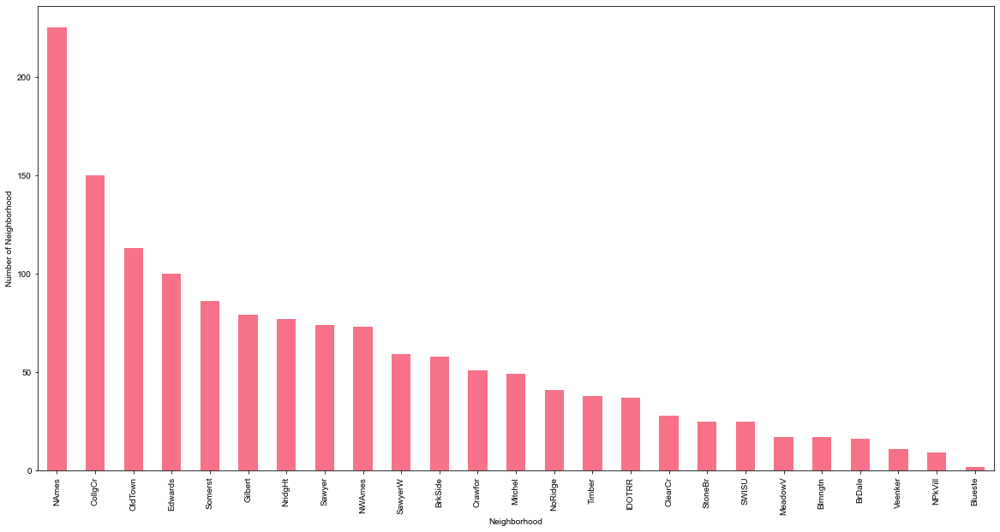

In [30]:
# show cardinality in the 'Neighborhood' variable
plt.figure(figsize=(20,10))
data['Neighborhood'].value_counts().sort_values(ascending = False).plot.bar()
plt.xlabel('Neighborhood')
plt.ylabel('Number of Neighborhood')
sns.set_theme(style="darkgrid")

<Figure size 432x288 with 0 Axes>

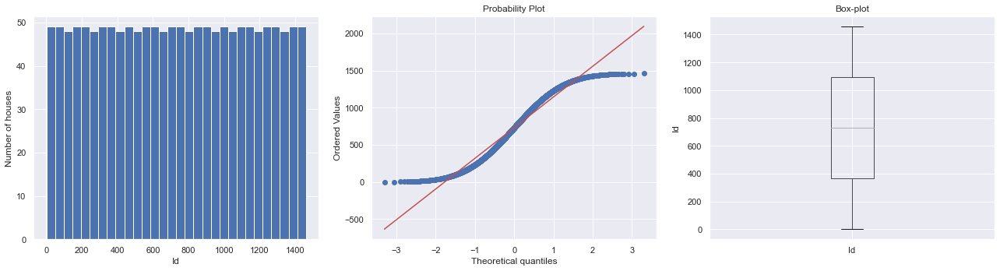

<Figure size 432x288 with 0 Axes>

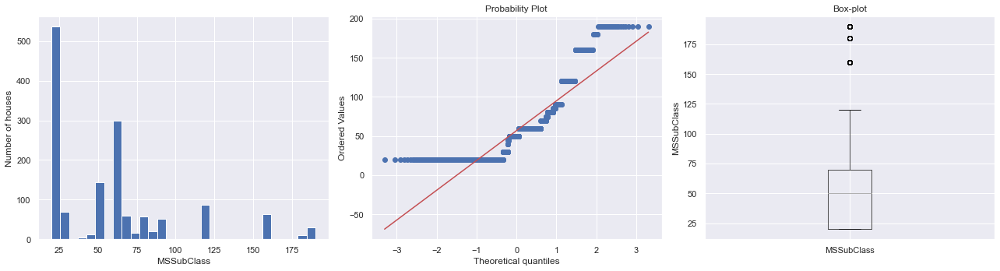

<Figure size 432x288 with 0 Axes>

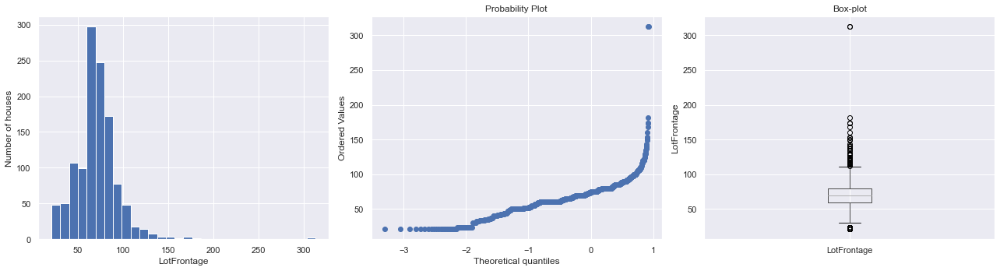

<Figure size 432x288 with 0 Axes>

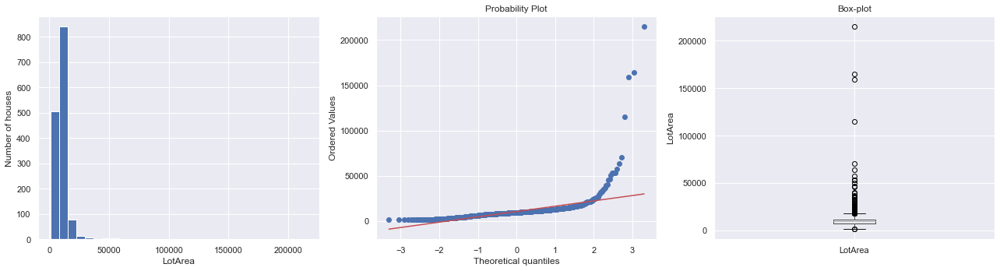

<Figure size 432x288 with 0 Axes>

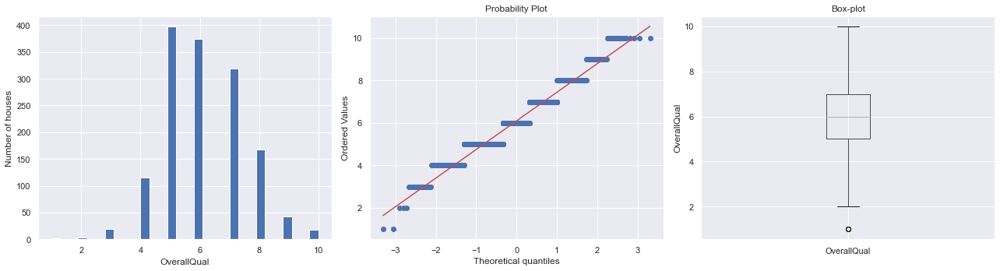

<Figure size 432x288 with 0 Axes>

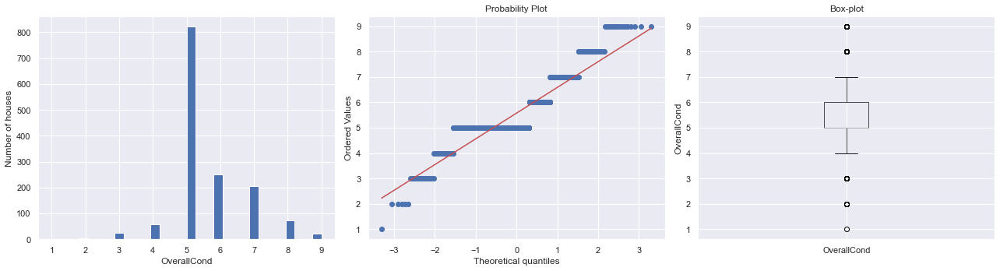

<Figure size 432x288 with 0 Axes>

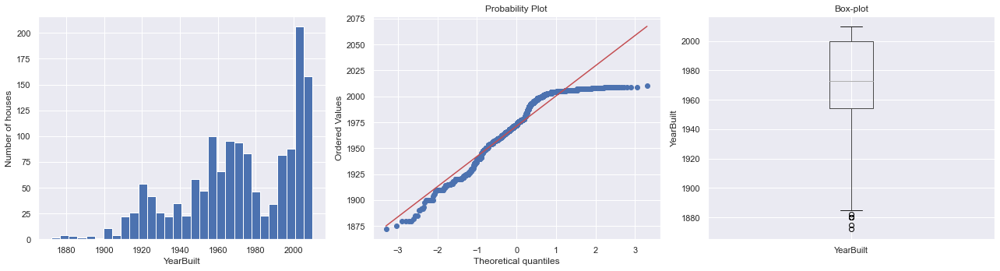

<Figure size 432x288 with 0 Axes>

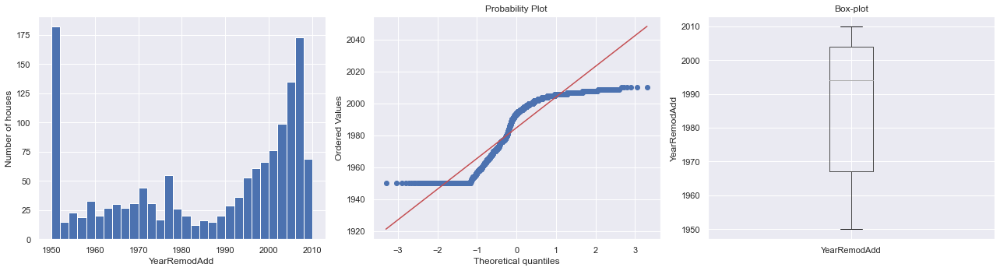

<Figure size 432x288 with 0 Axes>

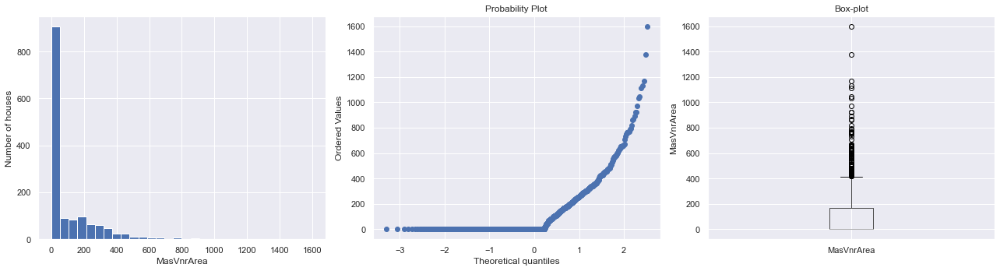

<Figure size 432x288 with 0 Axes>

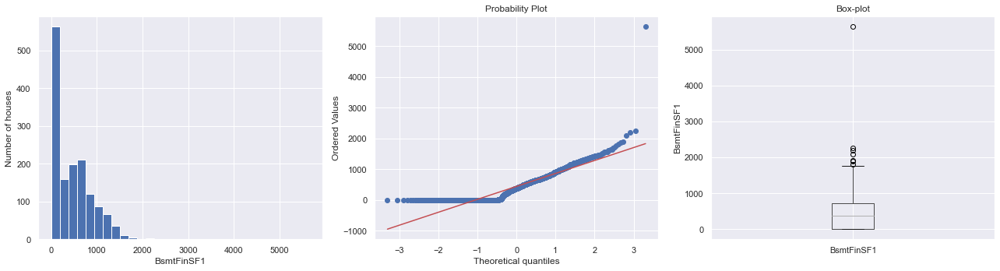

<Figure size 432x288 with 0 Axes>

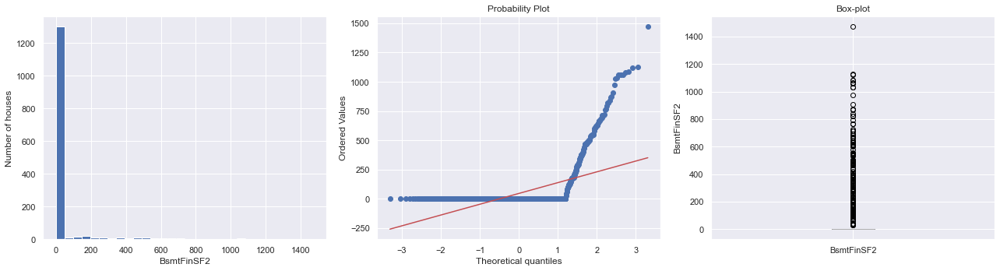

<Figure size 432x288 with 0 Axes>

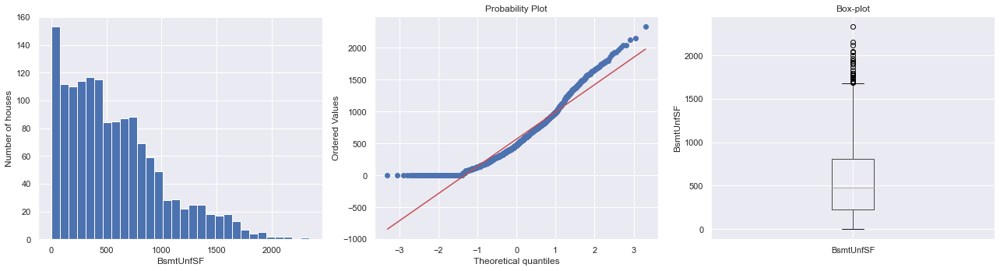

<Figure size 432x288 with 0 Axes>

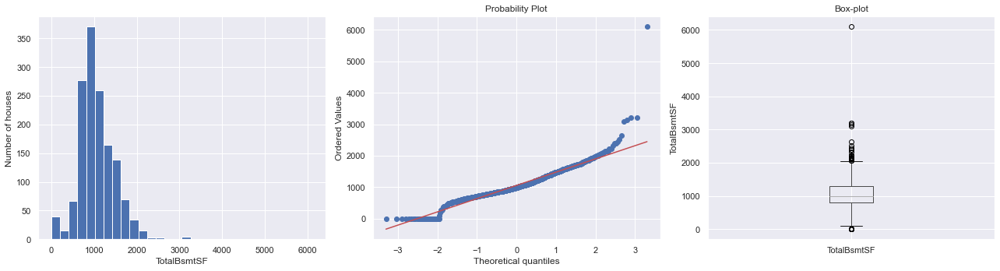

<Figure size 432x288 with 0 Axes>

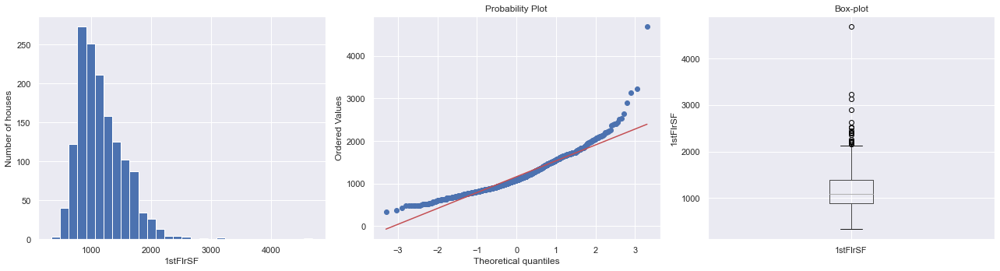

<Figure size 432x288 with 0 Axes>

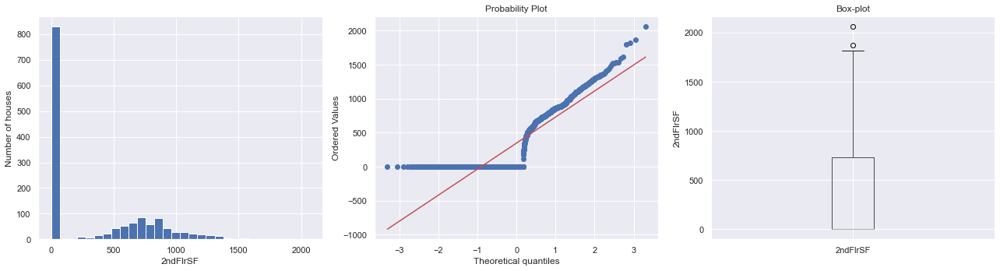

<Figure size 432x288 with 0 Axes>

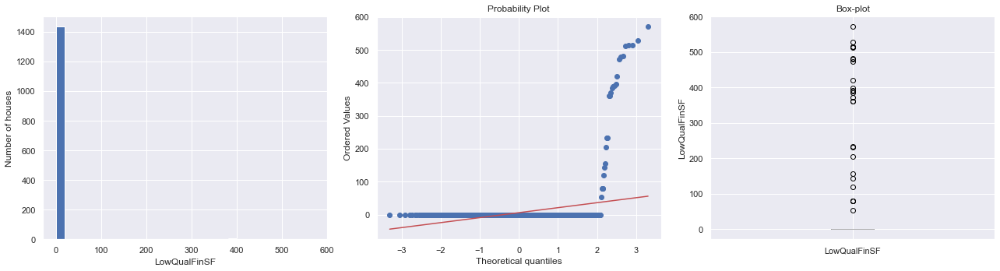

<Figure size 432x288 with 0 Axes>

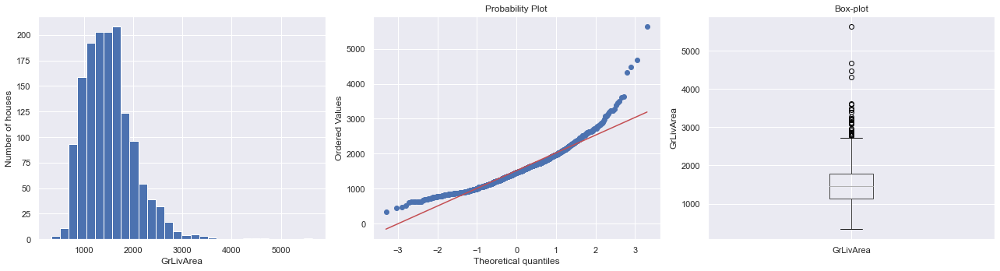

<Figure size 432x288 with 0 Axes>

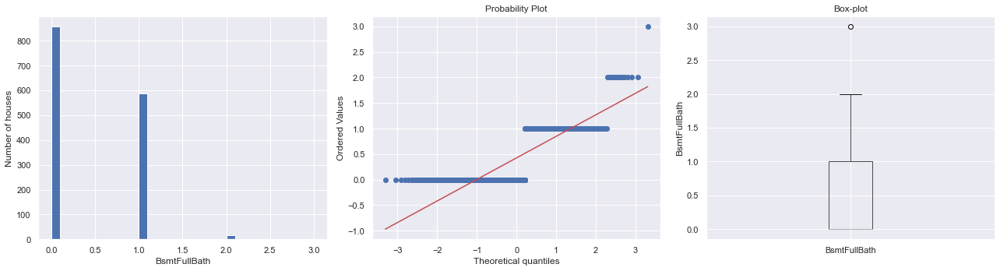

<Figure size 432x288 with 0 Axes>

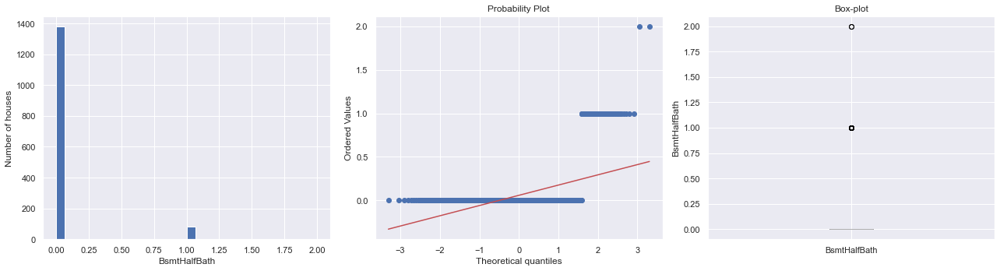

<Figure size 432x288 with 0 Axes>

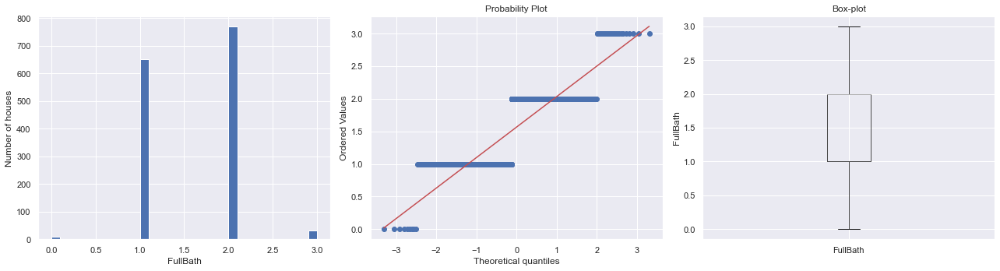

<Figure size 432x288 with 0 Axes>

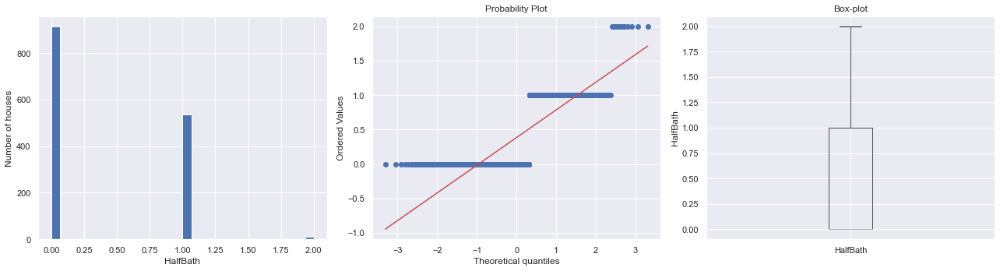

<Figure size 432x288 with 0 Axes>

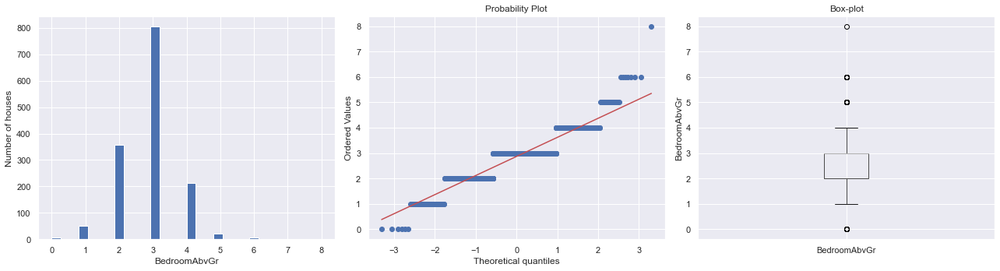

<Figure size 432x288 with 0 Axes>

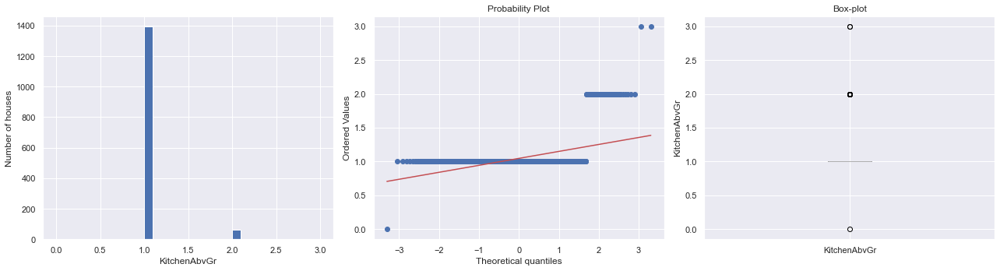

<Figure size 432x288 with 0 Axes>

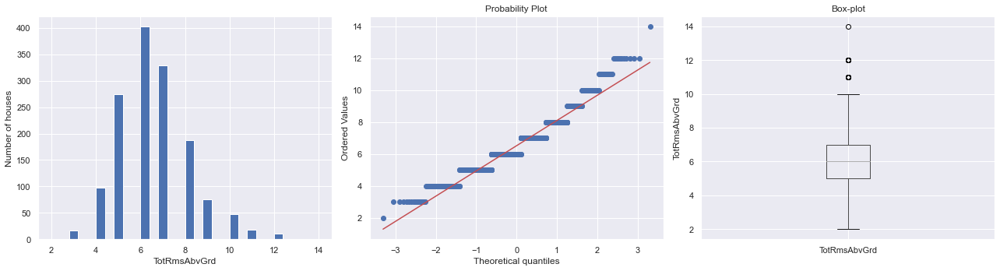

<Figure size 432x288 with 0 Axes>

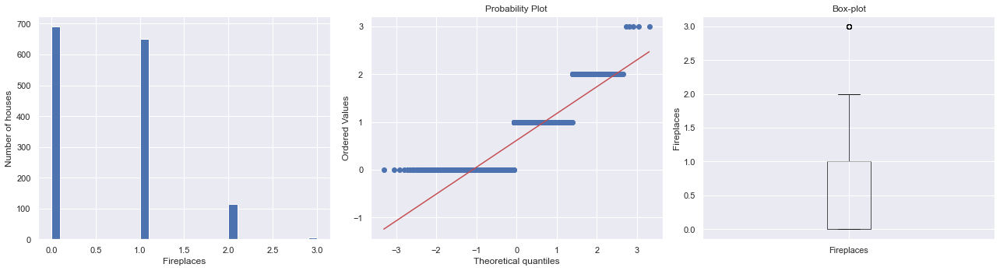

<Figure size 432x288 with 0 Axes>

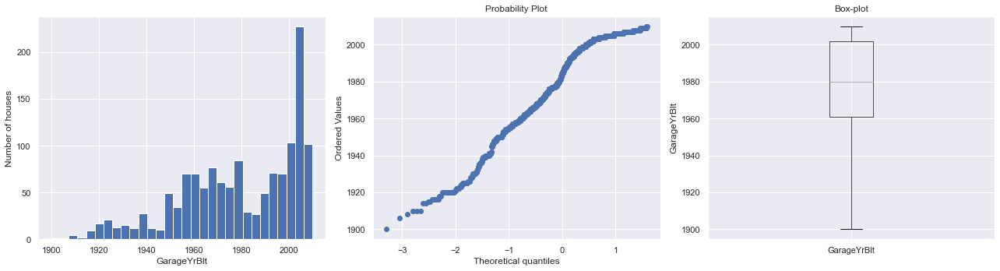

<Figure size 432x288 with 0 Axes>

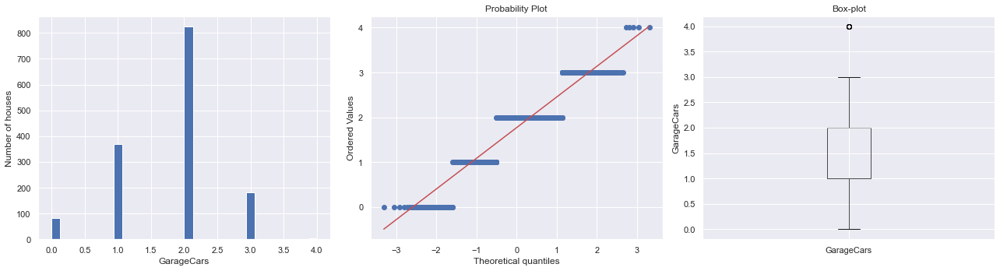

<Figure size 432x288 with 0 Axes>

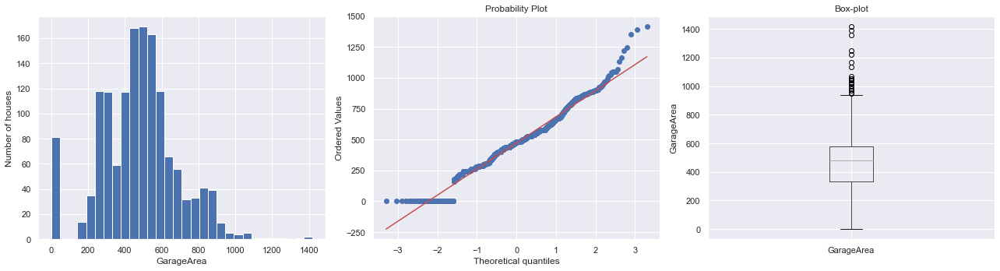

<Figure size 432x288 with 0 Axes>

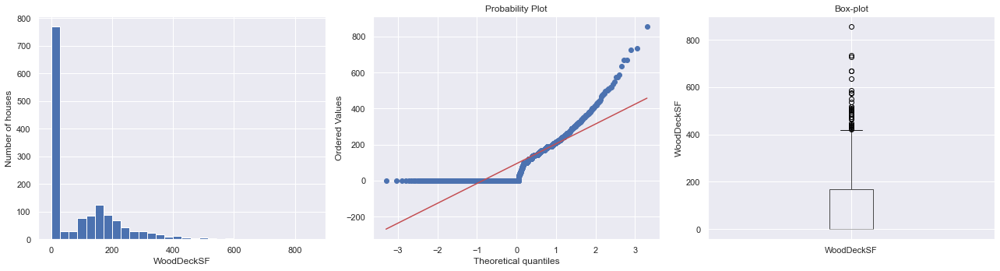

<Figure size 432x288 with 0 Axes>

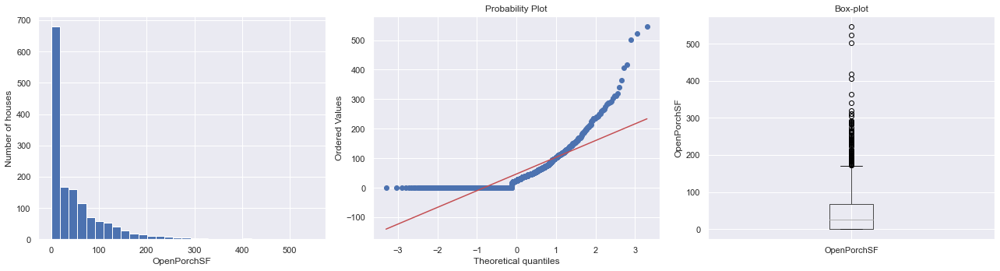

<Figure size 432x288 with 0 Axes>

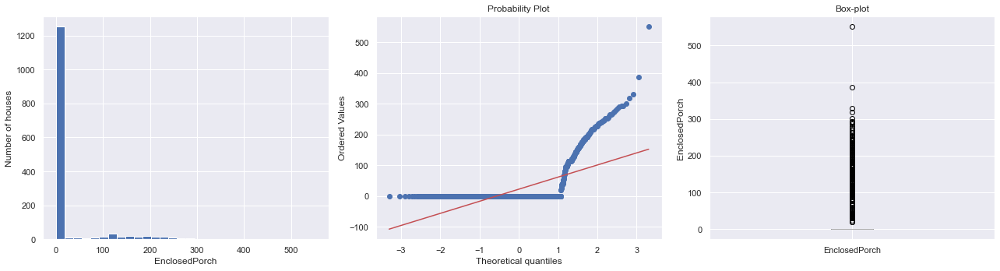

<Figure size 432x288 with 0 Axes>

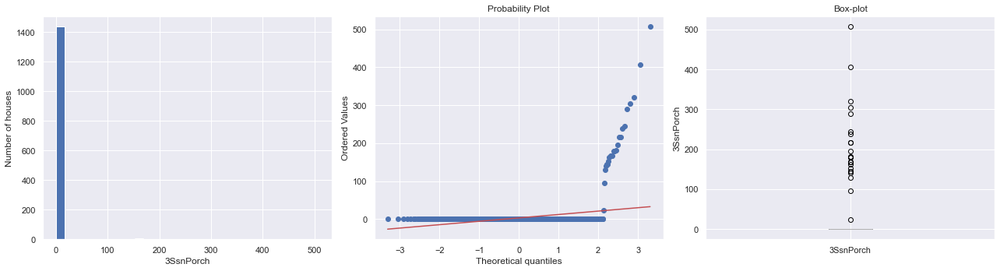

<Figure size 432x288 with 0 Axes>

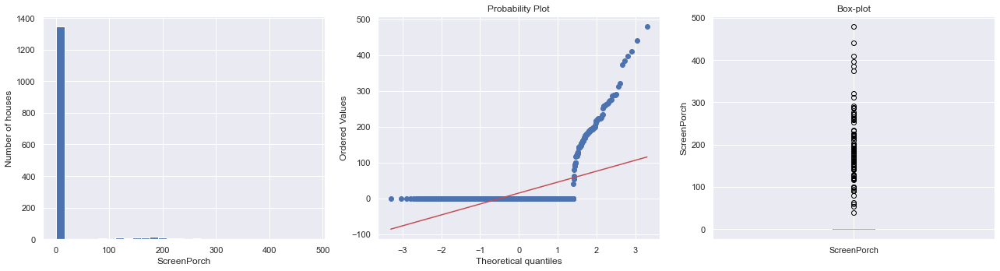

<Figure size 432x288 with 0 Axes>

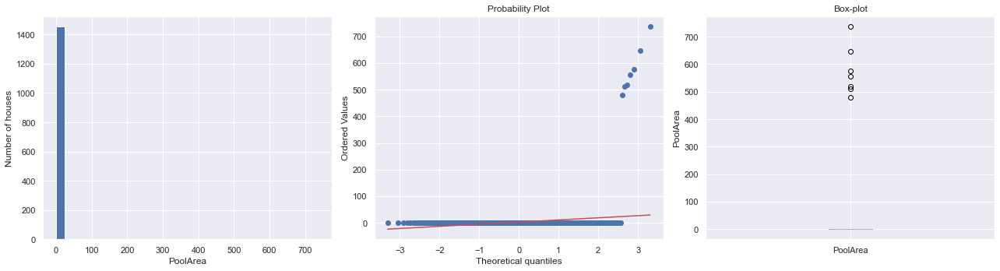

<Figure size 432x288 with 0 Axes>

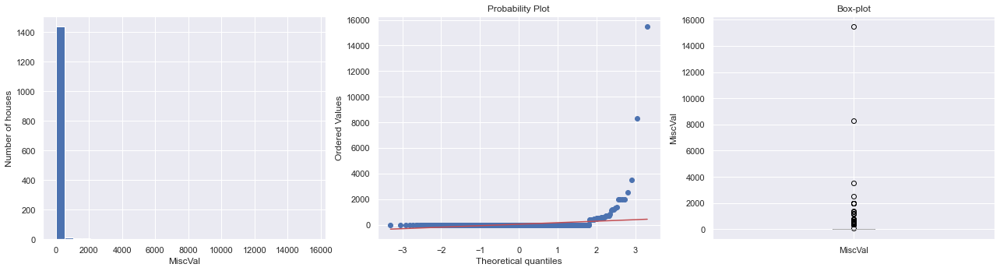

<Figure size 432x288 with 0 Axes>

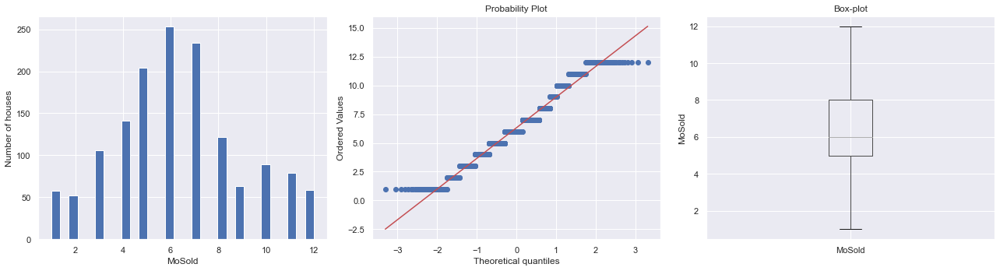

<Figure size 432x288 with 0 Axes>

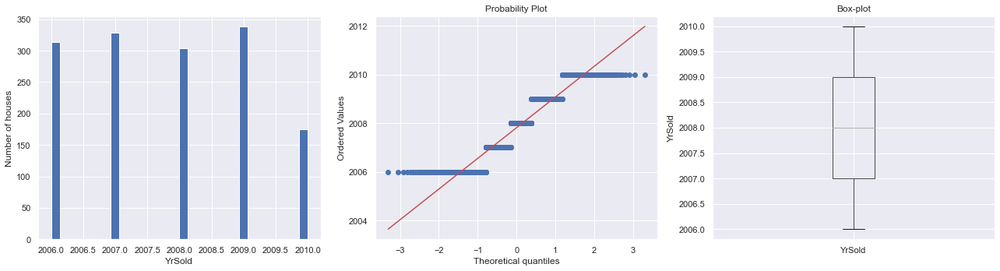

<Figure size 432x288 with 0 Axes>

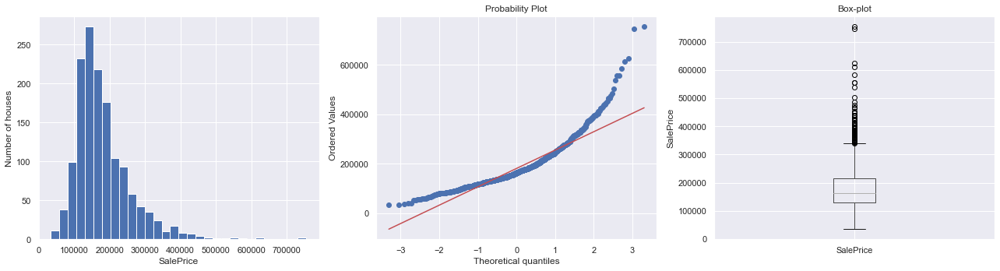

In [31]:
# Show data distribution [historgram, probability plot, box plot]
for var in data[numerical]:
    diagnostic_plots(data[numerical], var)

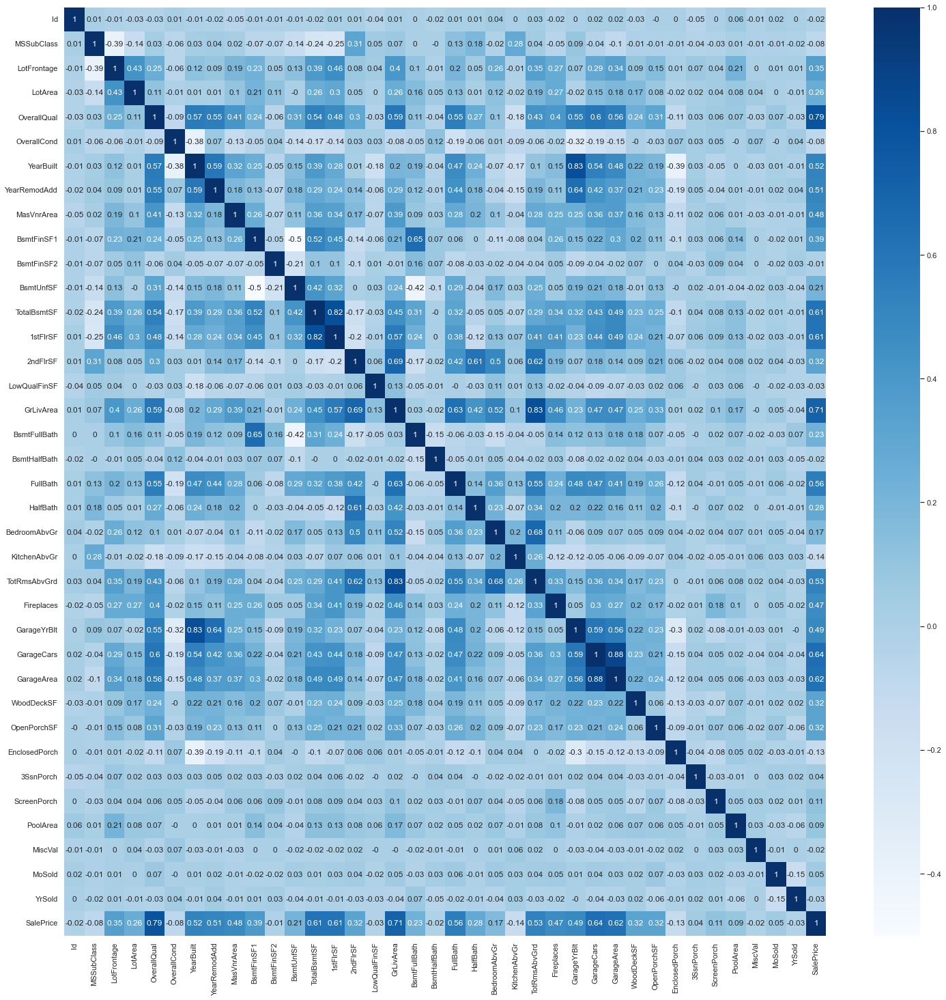

In [32]:
# Defining correlation between study variables 
corr = data.corr().round(2)
fig = plt.figure(figsize = (25, 25))
sns.heatmap(corr, annot = True, cmap = "Blues")
plt.show()

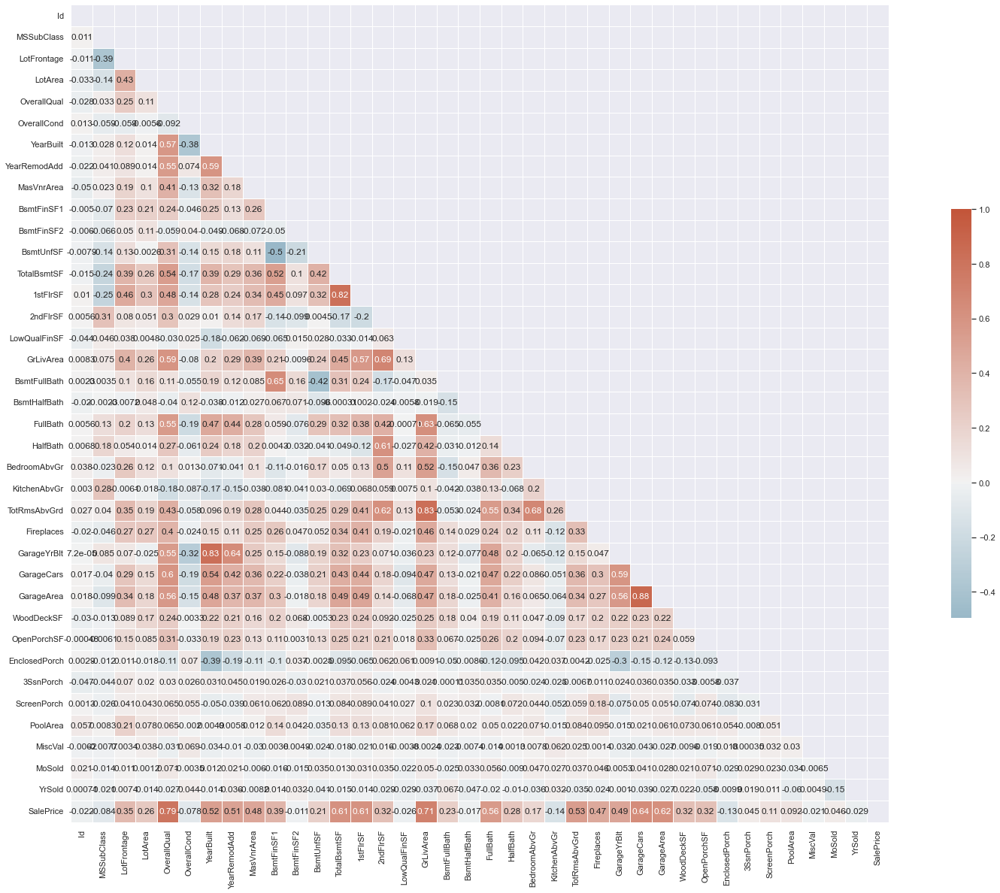

In [33]:
# Defining correlation between study variables 
f, ax = plt.subplots(figsize=(30, 20))
mat = data.corr('pearson')
mask = np.triu(np.ones_like(mat, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(mat, mask=mask, cmap=cmap, vmax=1, center=0, annot = True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

Here we see confirmation of the importance of the OverallQual feature. We also see many interesting connections here - for example, we can conclude that garages are built together with the house =) (GarageYearBlt - YearBllt); but LotArea surprisingly does not affect the price much.

In [34]:
# Check multicollinearity
multicollinearity(data, 0.7)

0.82 1stFlrSF TotalBsmtSF
0.825 TotRmsAbvGrd GrLivArea
0.826 GarageYrBlt YearBuilt
0.882 GarageArea GarageCars
0.791 SalePrice OverallQual
0.709 SalePrice GrLivArea


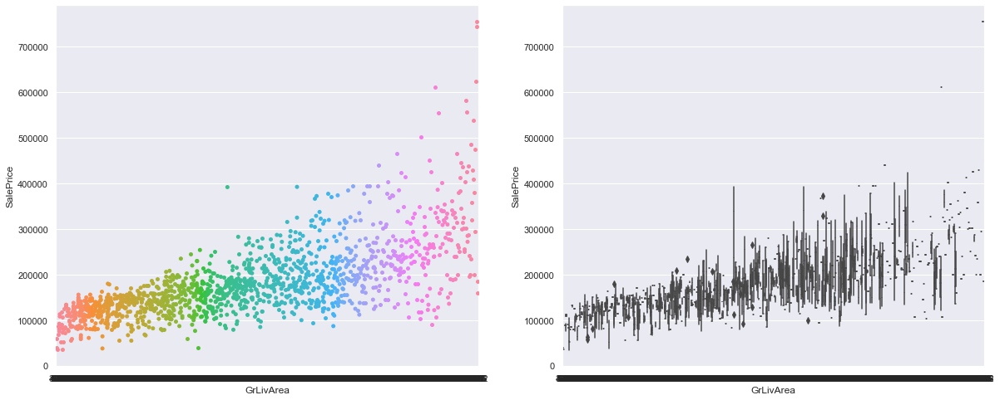

In [35]:
# SalePrice - GrLivArea [Pearson = 0.70]
figure, ax = plt.subplots(1,2, figsize = (20,8))
sns.stripplot(data=data, x = 'GrLivArea', y='SalePrice', ax = ax[0])
sns.boxplot(data=data, x = 'GrLivArea', y='SalePrice', ax = ax[1])
plt.show()

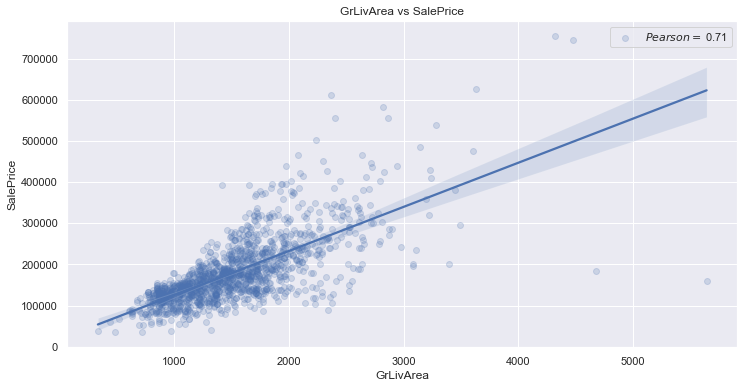

In [36]:
# SalePrice - GrLivArea [Pearson = 0.70]
Pearson_GrLiv = 0.71
plt.figure(figsize = (12,6))
sns.regplot(data=data, x = 'GrLivArea', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('GrLivArea vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_GrLiv)], loc = 'best')
plt.show()

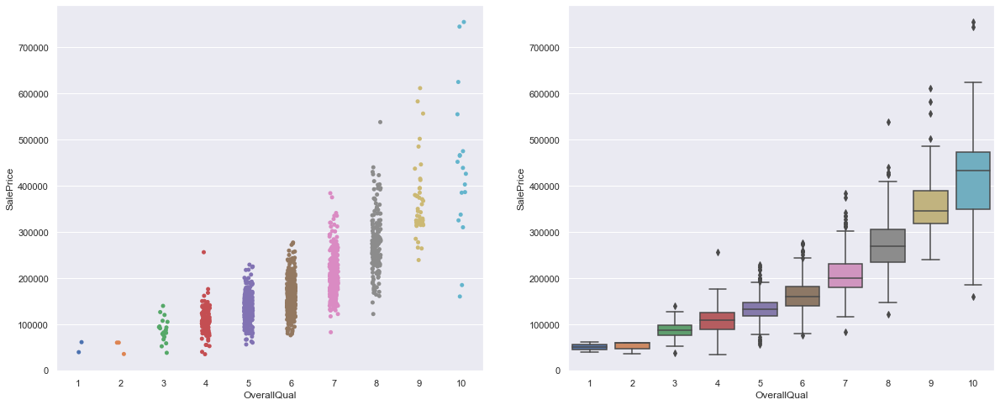

In [37]:
# OverallQuall - SalePrice [Pearson = 0.79]
figure, ax = plt.subplots(1,2, figsize = (20,8))
sns.stripplot(data=data, x = 'OverallQual', y='SalePrice', ax = ax[0])
sns.boxplot(data=data, x = 'OverallQual', y='SalePrice', ax = ax[1])
plt.show()

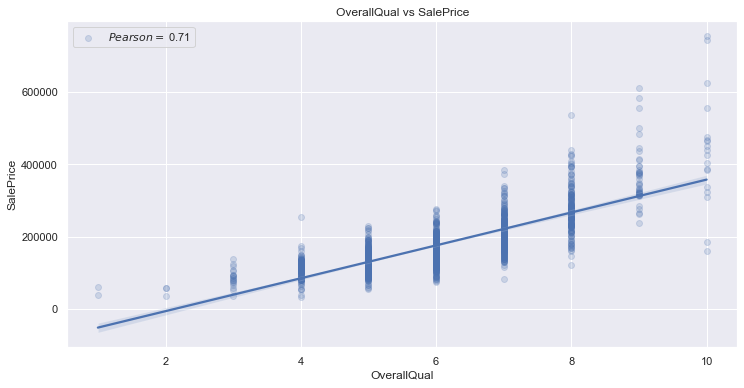

In [38]:
# OverallQuall - SalePrice [Pearson = 0.79]
Pearson_GrLiv = 0.71
plt.figure(figsize = (12,6))
sns.regplot(data=data, x = 'OverallQual', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('OverallQual vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_GrLiv)], loc = 'best')
plt.show()

In [39]:
# Visualizing features relations
fig = px.histogram(data, x = "OverallQual",
                   y = "SalePrice",
                   marginal = None,
                   color = "HouseStyle",
                   text_auto = True,
                   hover_data  = data.columns,
                   height = 500, width = 1000)
fig.show()

The oldest house has been built in 1872.The newest house has been built in 2010

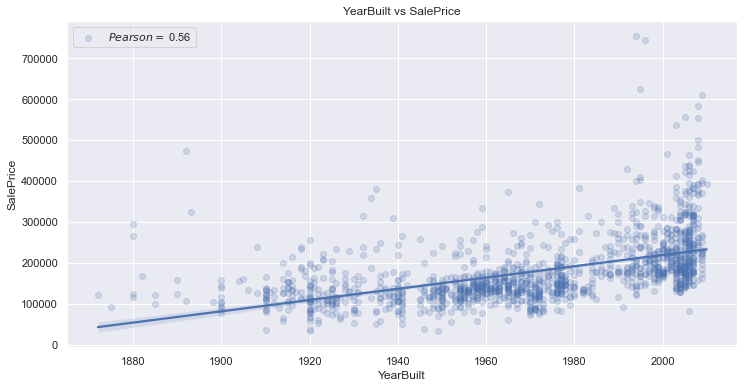

In [43]:
# Visualizing Sale price and the year when house was build
Pearson_YrBlt = 0.56
plt.figure(figsize = (12,6))
sns.regplot(data=data, x = 'YearBuilt', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('YearBuilt vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_YrBlt)], loc = 'best')
plt.show()

In [44]:
# Visualizing Sale price and the year when house was build
fig = px.histogram(data, x = "YearBuilt",
                   y = "SalePrice",
                   marginal = None,
                   color = "YearBuilt",
                   text_auto = True,
                   hover_data  = data.columns,
                   height = 500, width = 1000)
fig.show()

In [46]:
# Visualizing Sale price and Neighborhood 
fig = px.histogram(data, x = "Neighborhood",
                   y = "SalePrice",
                   marginal = None,
                   color = "Neighborhood", text_auto = True,
                   hover_data  = data.columns,
                   height = 500, width = 1000)
fig.show()

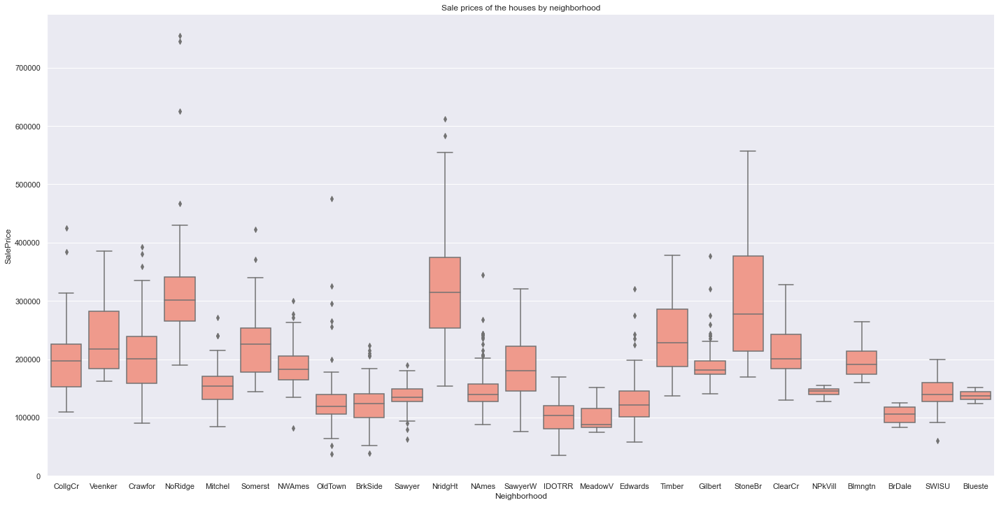

In [47]:
# Visualizing Sale price and Neighborhood 
sns.catplot(x = "Neighborhood",
            y = "SalePrice",
            kind = "box",
            height = 10,
            aspect = 2,
            color = "#ff8e7c",
            data = data).set(title = "Sale prices of the houses by neighborhood");

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\seaborn\axisgrid.py:337: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



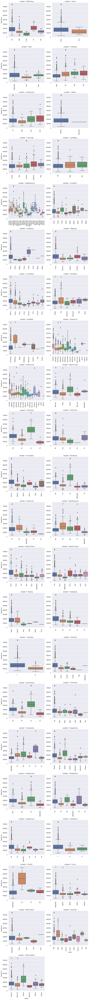

In [48]:
# Visualizing relationship between dependent and independent variables 
for c in categorical:
    data[c] = data[c].astype('category')
    if data[c].isnull().any():
        data[c] = data[c].cat.add_categories(['MISSING'])
        data[c] = data[c].fillna('MISSING')

def boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)
f = pd.melt(data, id_vars=['SalePrice'], value_vars=categorical)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, size=5)
g = g.map(boxplot, "value", "SalePrice")

In [49]:
# Visualizing Sale price and Fireplaces 
fig = px.ecdf(data, x = "SalePrice", log_x = True, log_y = True,
              color = "Fireplaces", height = 500, width = 1000)
fig.show()

In [50]:
# Visualizing Sale price and GarageCars 
fig = px.ecdf(data, x = "SalePrice", log_x = True, log_y = True,
              color = "GarageCars", height = 500, width = 1000)
fig.show()

In [51]:
# Visualizing Sale price and LotFrontage 
fig = px.ecdf(data, x = "SalePrice", log_x = True, log_y = True,
              color = "LotFrontage", height = 500, width = 1000)
fig.show()

In [52]:
# Visualizing Sale price and LotArea 
fig = px.ecdf(data, x = "SalePrice", log_x = True, log_y = True,
              color = "LotArea", height = 500, width = 1000)
fig.show()

In [53]:
# Visualizing Sale price and YearBuilt 
fig = px.ecdf(data, x = "SalePrice", log_x = True, log_y = True,
              color = "YearBuilt", height = 500, width = 1000)
fig.show()

In [54]:
# Visualizing Sale price and YearRemodAdd 
fig = px.ecdf(data, x = "SalePrice", log_x = True, log_y = True,
              color = "YearRemodAdd", height = 500, width = 1000)
fig.show()

In [56]:
# Visualizing Sale price and TotRmsAbvGrd 
fig = px.ecdf(data, x = "SalePrice", log_x = True, log_y = True,
              color = "TotRmsAbvGrd", height = 500, width = 1000)
fig.show()

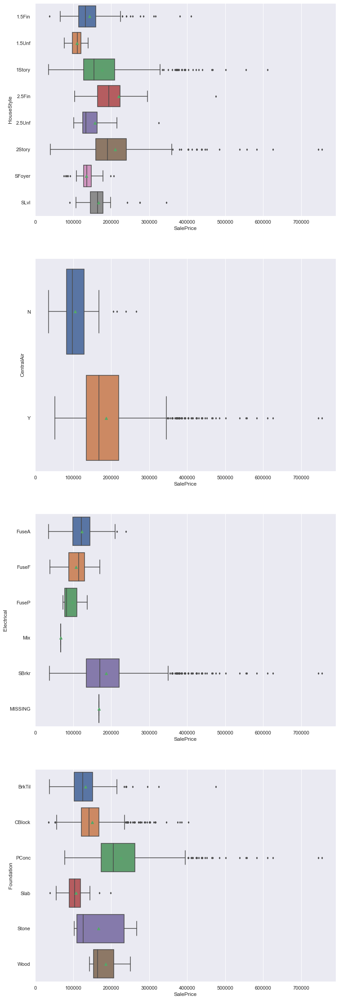

In [57]:
# Visualizing Sale price and HouseStyle, CentralAir, Electrical, Foundation  
fig, axarr = plt.subplots(4, figsize=(12,40))
sns.boxplot(y = 'HouseStyle', x = 'SalePrice', data = data,width = 0.8,orient = 'h', showmeans = True, fliersize = 3, ax = axarr[0])
sns.boxplot(y = 'CentralAir', x = 'SalePrice', data = data,width = 0.8,orient = 'h', showmeans = True, fliersize = 3, ax = axarr[1])
sns.boxplot(y = 'Electrical', x = 'SalePrice', data = data,width = 0.8,orient = 'h', showmeans = True, fliersize = 3, ax = axarr[2])
sns.boxplot(y = 'Foundation', x = 'SalePrice', data = data,width = 0.8,orient = 'h', showmeans = True, fliersize = 3, ax = axarr[3])
plt.show()

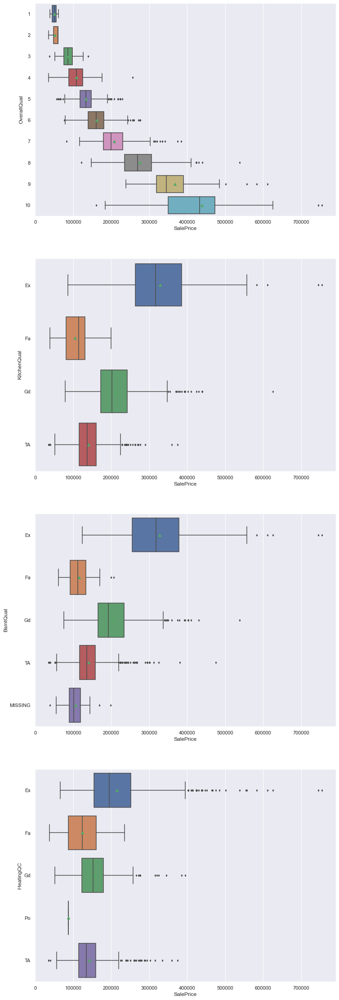

In [58]:
# Visualizing Sale price and OverallQual, KitchenQual, BsmtQual, HeatingQC  
fig, axarr = plt.subplots(4, figsize=(12,40))
sns.boxplot(y = 'OverallQual', x = 'SalePrice', data = data,width = 0.8,orient = 'h', showmeans = True, fliersize = 3, ax = axarr[0])
sns.boxplot(y = 'KitchenQual', x = 'SalePrice', data = data,width = 0.8,orient = 'h', showmeans = True, fliersize = 3, ax = axarr[1])
sns.boxplot(y = 'BsmtQual', x = 'SalePrice', data = data,width = 0.8,orient = 'h', showmeans = True, fliersize = 3, ax = axarr[2])
sns.boxplot(y = 'HeatingQC', x = 'SalePrice', data = data,width = 0.8,orient = 'h', showmeans = True, fliersize = 3, ax = axarr[3])
plt.show()

Text(0, 0.5, 'Number of labels')

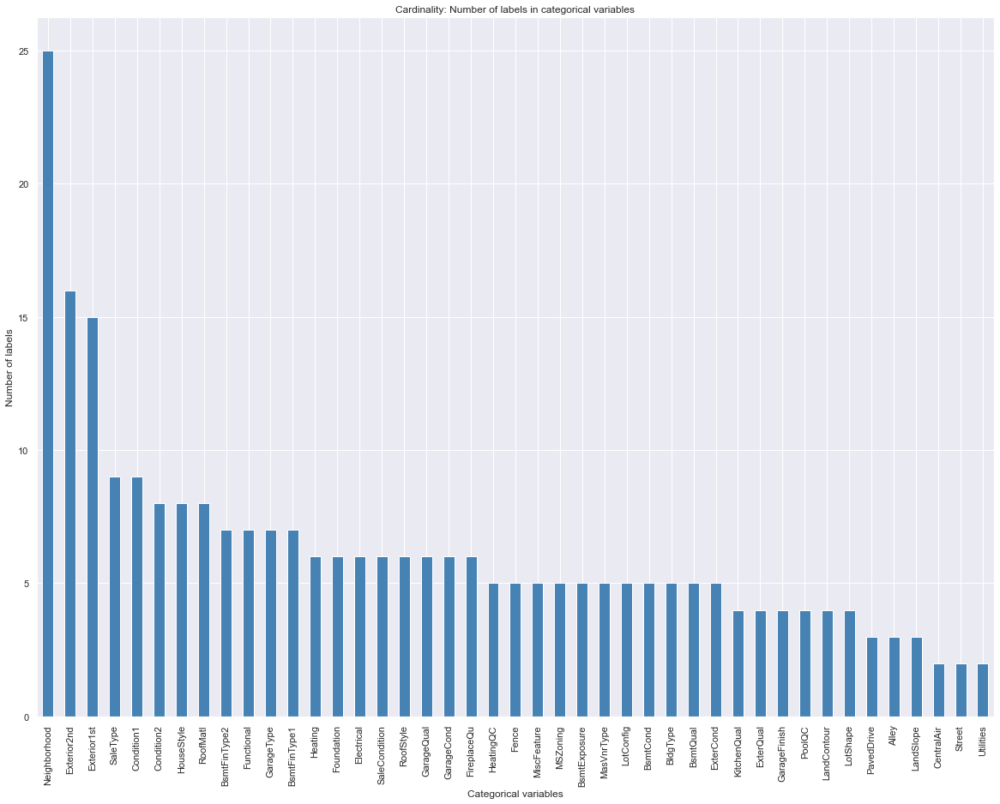

In [59]:
# Check cardinality in categorical variables
data[categorical].nunique().sort_values(ascending = False).plot.bar(figsize = (20, 15), color = 'steelblue')
plt.title('Cardinality: Number of labels in categorical variables')
plt.xlabel('Categorical variables')
plt.ylabel('Number of labels')

There are three categorical columns with high cardinality (Neighborhood, Exterior1st, Exterior2nd) which have more than 10 labels. Other columns have high cardinality from 2 to 10 labels. 

## 5. Data preprocessing 

In [60]:
# Drop variables that have more than 40% of missing values
data = data.drop(columns=['Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature'], axis = 1)

In [61]:
# Drop variables variables with multicollinearity 
data = data.drop(columns=['TotRmsAbvGrd', 'GarageYrBlt', '1stFlrSF', 'GarageArea'], axis = 1)

In [62]:
# Defining house age 
data['HouseAge'] = data['YrSold'] - data['YearBuilt']
data['HouseAge'].unique()

array([  5,  31,   7,  91,   8,  16,   3,  36,  77,  69,  43,   1,  46,
        48,  78,  40,  39,   4,  51,   6,  42,   2,  59,  49,  81,  88,
        15,  55,  57,  53,  41,  24,  33,  47,  89,  10,  72,  25,  52,
        44,   0,  87,  12,  65,  34,  11,  56,  95,  60,  99,  14,  94,
        13,  45,  97,  90,  30,  76, 122,  54,  62,  20,  37,  68,  50,
        71,   9,  38,  18,  58,  70,  32,  35,  83,  84,  66,  19,  22,
        86,  98, 114,  93,  75,  82,  17, 106,  29,  96,  27,  92, 128,
        61,  67,  21,  26, 108,  28,  63,  73,  74,  80, 115, 126, 102,
        85,  23, 110, 117, 129,  64, 100, 111, 104, 119, 127, 107, 135,
       109, 136, 103,  79, 125], dtype=int64)

In [63]:
# Defining house remodelling   
data['RemodHouse'] = data['YrSold'] - data['YearRemodAdd']
data['RemodHouse'].unique()

array([ 5, 31,  6, 36,  8, 14,  2, 58, 43,  0, 46, 48, 40, 39,  4, 44, 57,
        9, 10,  1, 51, 19,  3, 53, 41, 24, 28, 47, 56, 52, 11, 60, 21, 34,
        7, 42, 13, 27, 12, 45, 16, 25, 30, 33, 54, 20, 37, 50, 15, 38, 17,
       32, 35, 22, 18, 59, 29, 49, 26, -1, 55, 23], dtype=int64)

In [64]:
# Create a copy of variable
data['Season'] = data['MoSold'].copy()

In [65]:
# Transform 'MoSold' variable into 'Season'
data = data.replace({'Season': {1: 'winter', 2: 'winter', 12: 'winter', 
                                    3: 'spring', 4: 'spring', 5: 'spring', 
                                    6: 'summer', 7: 'summer', 8: 'summer', 
                                    9: 'autumn', 10:'autumn', 11: 'autumn'}})
data[['MoSold', 'Season']].head(10)

,MoSold,Season
0,2,winter
1,5,spring
2,9,autumn
3,2,winter
4,12,winter
5,10,autumn
6,8,summer
7,11,autumn
8,4,spring
9,1,winter


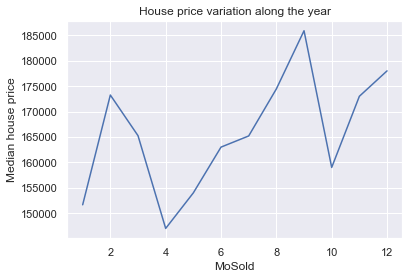

In [66]:
#plot before creating a new feature
data.groupby('MoSold')['SalePrice'].median().plot()
plt.title('House price variation along the year')
plt.ylabel('Median house price')
plt.show()

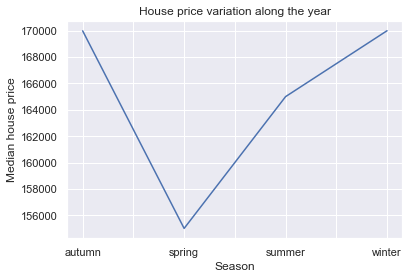

In [67]:
#plot after creating a new feature
data.groupby('Season')['SalePrice'].median().plot()
plt.title('House price variation along the year')
plt.ylabel('Median house price')
plt.show()

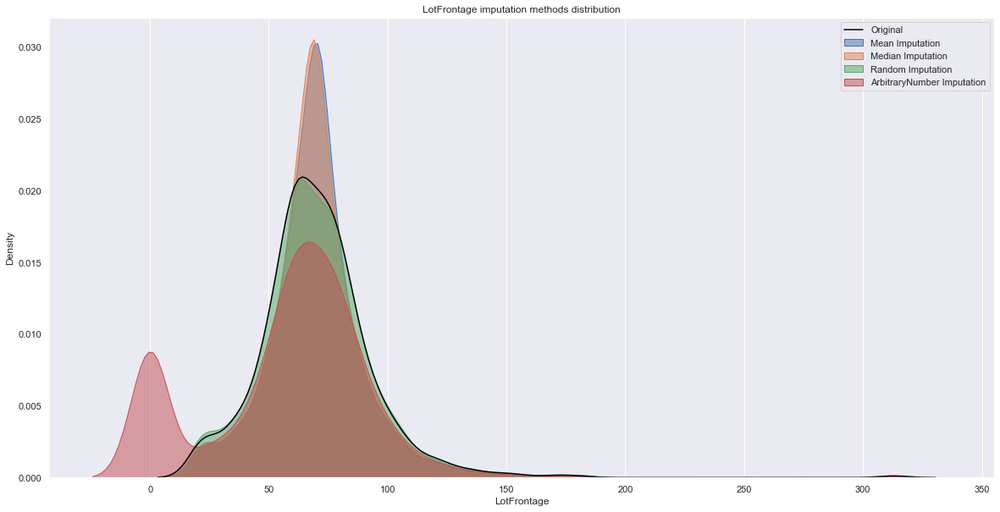

In [68]:
# MeanMedian, RandomSample imputation observation

# Create df with target feature
analysis_df = pd.concat([
    data['LotFrontage'].copy(),
    data['LotFrontage'].copy(),
    data['LotFrontage'].copy(),
    data['LotFrontage'].copy(),
    data['LotFrontage'].copy()
],axis=1)
analysis_df.columns = [
    'LotFrontage','LotFrontage_mean','LotFrontage_median','LotFrontage_random','LotFrontage_arbitrary'
]
analysis_df

# Imputation pipe by methods
imputer_pipe = Pipeline([
    ('mean',MeanMedianImputer(imputation_method='mean',variables=['LotFrontage_mean'])),
    ('median',MeanMedianImputer(imputation_method='median',variables=['LotFrontage_median'])),
    ('random',RandomSampleImputer(variables=['LotFrontage_random'])),
    ('arbitrary',ArbitraryNumberImputer(arbitrary_number=0,variables=['LotFrontage_arbitrary']))
])

analysis_df = imputer_pipe.fit_transform(analysis_df)

# Create the KDE plot
plt.figure(figsize=(20,10))
sns.kdeplot(analysis_df['LotFrontage'].dropna(), label='Original', shade=False, color = 'black')
sns.kdeplot(analysis_df['LotFrontage_mean'], label='Mean Imputation', shade=True, alpha=0.5)
sns.kdeplot(analysis_df['LotFrontage_median'], label='Median Imputation', shade=True, alpha=0.5)
sns.kdeplot(analysis_df['LotFrontage_random'], label='Random Imputation', shade=True, alpha=0.5)
sns.kdeplot(analysis_df['LotFrontage_arbitrary'], label='ArbitraryNumber Imputation', shade=True, alpha=0.5)

# Add the legend
plt.legend()

# Add grid
plt.grid(axis='y')

# Title 
plt.title('LotFrontage imputation methods distribution')

# Show the plot
plt.show()

In [69]:
print('Original variance: ', analysis_df['LotFrontage'].var())
print('Variance after mean imputation: ', analysis_df["LotFrontage_mean"].var())
print('Variance after median imputation: ', analysis_df["LotFrontage_median"].var())
print('Variance after random imputation: ', analysis_df["LotFrontage_random"].var())
print('Variance after arbitrary imputation: ', analysis_df["LotFrontage_arbitrary"].var())

Original variance:  589.7491687482642
Variance after mean imputation:  485.0575753926782
Variance after median imputation:  485.218557935159
Variance after random imputation:  595.2936515909735
Variance after arbitrary imputation:  1201.6139878130114


In [70]:
#Drop the variables since we have already transformed them, 
# and also remove the "id" variable right away, since it uniquely identifies each record
data = data.drop(['YearBuilt', 'YearRemodAdd','MoSold','YrSold','Id'], axis = 1)

In [71]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 70 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSSubClass     1460 non-null   int64   
 1   MSZoning       1460 non-null   category
 2   LotFrontage    1201 non-null   float64 
 3   LotArea        1460 non-null   int64   
 4   Street         1460 non-null   category
 5   LotShape       1460 non-null   category
 6   LandContour    1460 non-null   category
 7   Utilities      1460 non-null   category
 8   LotConfig      1460 non-null   category
 9   LandSlope      1460 non-null   category
 10  Neighborhood   1460 non-null   category
 11  Condition1     1460 non-null   category
 12  Condition2     1460 non-null   category
 13  BldgType       1460 non-null   category
 14  HouseStyle     1460 non-null   category
 15  OverallQual    1460 non-null   int64   
 16  OverallCond    1460 non-null   int64   
 17  RoofStyle      1460 non-null   ca

## 6. Splitting dataset on train and test data

In [72]:
x_train, x_test, y_train, y_test = train_test_split(data.drop(columns=['SalePrice'], axis=1),
                                                 data.SalePrice,
                                                 test_size=0.3,
                                                 random_state=0)

print("Training data set dimension : {}".format(x_train.shape))
print("Testing data set dimension : {}".format(x_test.shape))

Training data set dimension : (1022, 69)
Testing data set dimension : (438, 69)


## 7. Feature selection & Pipeline

In [75]:
# Define categorical variables
cat_list = [var for var in x_train.columns if x_train [var].dtype == 'O']
print('There are {} categorical variabls'.format(len(cat_list)))

# Define numerical variables
num_list = [var for var in x_train.columns if x_train[var].dtype !='O']
print('There are {} numerical variabls'.format(len(num_list)))

There are 1 categorical variabls
There are 68 numerical variabls


In [76]:
# Define categorical variables
x_train[cat_list] = x_train[cat_list].astype('O')
x_test[cat_list] = x_test[cat_list].astype('O')

In [77]:
# Check shape of our train & test sets
x_train.shape, x_test.shape

((1022, 69), (438, 69))

In [78]:
# Make lists to save regression results
algorithms_model_list = []    

MAE_train = []
RMSE_train = []
R2_train = []

MAE_test = []
RMSE_test = []
R2_test = []

### 7.1 XGBRegressor - Modeling with GridSearch & Pipeline 

In [109]:
# Define pipeline for feature engineering & feature selection
pipe_xgb = Pipeline([
    ('imputer_num', MeanMedianImputer(imputation_method = 'median', variables = num_list)), 
    ('imputer_cat', CategoricalImputer(imputation_method = 'missing', variables = cat_list, return_object = True)),
    ('rare_label', RareLabelEncoder(tol = 0.05, n_categories = 3)),
    ('discretizer', EqualFrequencyDiscretiser(q = 10, variables = num_list)), 
    ('encoding', OneHotEncoder()),
    ('scaler', StandardScaler()), 
    ('constant', DropConstantFeatures(tol = 0.91)),
    ('duplicated', DropDuplicateFeatures()),
    ('smart_corr_sel', SmartCorrelatedSelection()),
    ('XGB', XGBRegressor(random_state = 0, gamma = 0, 
                                              learning_rate = 0.01, 
                                              min_child_weight = 0.01, 
                                              max_depth = 2, 
                                              n_estimators = 400))])

In [110]:
# Apply GridSearch
xgb_param_grid = [{
    'imputer_num__imputation_method':['mean','median'], 
    'imputer_cat__imputation_method':['frequent','missing'],
    'rare_label__n_categories':[2, 3],
    'discretizer__q':[5, 6, 7, 10], 
    'encoding': [OrdinalEncoder(encoding_method = 'ordered'),
                CountFrequencyEncoder(encoding_method = 'count'), 
                OneHotEncoder()], 
    'scaler':[StandardScaler(), MinMaxScaler()],
    'XGB__n_estimators' : [100, 200, 300],     
    'XGB__max_depth': [2, 3],                   
    'XGB__learning_rate': [0.01, 0.05, 0.1],   
    'XGB__gamma': [0, 1, 10],                  
    'XGB__min_child_weight': [0.01, 0.1, 0.5]  
}]

In [111]:
# Define GridSearch
xgb_grid_search = GridSearchCV(estimator = pipe_xgb, param_grid = xgb_param_grid, cv = 5, 
                               n_jobs = -1, scoring = 'r2')

In [112]:
# Fit the model
xgb_grid_search.fit(x_train, y_train)

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning:


15552 fits failed out of a total of 155520.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15552 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\pipeline.py", line 390, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\pipeline.py", line 348, in _fit
    X, fitted_transformer = fit_transform_one_cac

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('imputer_num',
                                        MeanMedianImputer(variables=['MSSubClass',
                                                                     'LotFrontage',
                                                                     'LotArea',
                                                                     'OverallQual',
                                                                     'OverallCond',
                                                                     'MasVnrArea',
                                                                     'BsmtFinSF1',
                                                                     'BsmtFinSF2',
                                                                     'BsmtUnfSF',
                                                                     'TotalBsmtSF',
                                                                     '2ndFlrSF',
               

In [113]:
print('{} R2 score train set: {}'.format('XGBoost Regressor', xgb_grid_search.score(x_train, y_train)))
print('{} R2 score test set: {}'.format('XGBoost Regressor', xgb_grid_search.score(x_test, y_test)))

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

XGBoost Regressor R2 score train set: 0.9697735770314486


C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

XGBoost Regressor R2 score test set: 0.8827266120086943


C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

In [283]:
# Define best parameters
xgb_grid_search.best_params_

{'XGB__gamma': 1,
 'XGB__learning_rate': 0.1,
 'XGB__max_depth': 3,
 'XGB__min_child_weight': 0.1,
 'XGB__n_estimators': 200,
 'discretizer__q': 10,
 'encoding': OneHotEncoder(),
 'imputer_cat__imputation_method': 'missing',
 'imputer_num__imputation_method': 'mean',
 'rare_label__n_categories': 3,
 'scaler': StandardScaler()}

In [284]:
# Define best estimators
model = xgb_grid_search.best_estimator_

In [285]:
# Transform train & test set
x_train_preds = model.predict(x_train)
x_test_preds = model.predict(x_test)

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

In [286]:
print('train MAE: {}'.format(mean_absolute_error(y_train, x_train_preds)))
print('train RMSE: {}'.format(sqrt(mean_squared_error(y_train, x_train_preds))))
print('train R2: {}'.format(r2_score(y_train, x_train_preds)))
print()

print('test MAE: {}'.format(mean_absolute_error(y_test, x_test_preds)))
print('test RMSE: {}'.format(sqrt(mean_squared_error(y_test, x_test_preds))))
print('test R2: {}'.format(r2_score(y_test, x_test_preds)))

train MAE: 9869.41938677226
train RMSE: 13578.431838168755
train R2: 0.9697735770314486

test MAE: 17562.989984660388
test RMSE: 28216.44958753167
test R2: 0.8827266120086943


In [287]:
# Record results 
algorithms_model_list.append('XGBoost_Regressor')
MAE_train.append(round(mean_absolute_error(y_train, x_train_preds),3))
RMSE_train.append(round(mean_squared_error(y_train, x_train_preds),3))
R2_train.append(round(r2_score(y_train, x_train_preds),3))
MAE_test.append(round(mean_absolute_error(y_test, x_test_preds),3))
RMSE_test.append(round(mean_squared_error(y_test, x_test_preds),3))
R2_test.append(round(r2_score(y_test, x_test_preds),3))

### 7.2 RandomForestRegressor - Modeling with GridSearch & Pipeline 

In [121]:
#Define pipeline for feature engineering & feature selection
pipe_rfr = Pipeline([
    ('imputer_num', MeanMedianImputer(imputation_method = 'median', variables = num_list)), 
    ('imputer_cat', CategoricalImputer(imputation_method = 'missing', variables = cat_list, return_object = True)),
    ('rare_label', RareLabelEncoder(tol = 0.05, n_categories = 3)),
    ('discretizer', EqualFrequencyDiscretiser(q = 10, variables = num_list)), 
    ('encoding', OneHotEncoder()),
    ('scaler', StandardScaler()), 
    ('constant', DropConstantFeatures(tol = 0.91)),
    ('duplicated', DropDuplicateFeatures()),
    ('smart_corr_sel', SmartCorrelatedSelection()),
    ('RF', RandomForestRegressor(n_estimators = 200, 
                                                      random_state = 0, 
                                                      #criterion = 'absolute_error', 
                                                     min_samples_split = 0.01, 
                                                     min_samples_leaf = 0.01))])

In [122]:
# Apply GridSearch
rfr_param_grid = [{
    'imputer_num__imputation_method':['mean','median'], 
    'imputer_cat__imputation_method':['frequent','missing'],
    'rare_label__n_categories':[2, 3],
    'discretizer__q':[5, 6, 7, 10], 
    'encoding': [OrdinalEncoder(encoding_method = 'ordered'),
                CountFrequencyEncoder(encoding_method = 'count'), 
                OneHotEncoder()], 
    'scaler':[StandardScaler(), MinMaxScaler()],
    'RF__n_estimators': [100, 200, 300], 
    'RF__max_depth': [2, 3, 4], 
    'RF__min_samples_leaf': [0.01, 1, 2], 
    'RF__min_samples_split': [0.01, 0.5, 1]
}]

In [123]:
# Define GridSearch
rfr_grid_search = GridSearchCV(estimator = pipe_rfr, param_grid = rfr_param_grid, cv = 5, 
                               n_jobs = -1, scoring = 'r2')

In [124]:
# Fit the model
rfr_grid_search.fit(x_train, y_train)

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning:


31104 fits failed out of a total of 77760.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
7776 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\pipeline.py", line 390, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\pipeline.py", line 348, in _fit
    X, fitted_transformer = fit_transform_one_cache

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('imputer_num',
                                        MeanMedianImputer(variables=['MSSubClass',
                                                                     'LotFrontage',
                                                                     'LotArea',
                                                                     'OverallQual',
                                                                     'OverallCond',
                                                                     'MasVnrArea',
                                                                     'BsmtFinSF1',
                                                                     'BsmtFinSF2',
                                                                     'BsmtUnfSF',
                                                                     'TotalBsmtSF',
                                                                     '2ndFlrSF',
               

In [125]:
print('{} R2 score train set: {}'.format('RandomForest', rfr_grid_search.score(x_train, y_train)))
print('{} R2 score test set: {}'.format('RandomForest', rfr_grid_search.score(x_test, y_test)))

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

RandomForest R2 score train set: 0.8564211175511647


C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

RandomForest R2 score test set: 0.8025832937903663


In [288]:
# Define best parameters
rfr_grid_search.best_params_

{'RF__max_depth': 4,
 'RF__min_samples_leaf': 1,
 'RF__min_samples_split': 0.01,
 'RF__n_estimators': 200,
 'discretizer__q': 10,
 'encoding': OneHotEncoder(),
 'imputer_cat__imputation_method': 'missing',
 'imputer_num__imputation_method': 'median',
 'rare_label__n_categories': 3,
 'scaler': MinMaxScaler()}

In [289]:
# Define best estimators
model = rfr_grid_search.best_estimator_

In [290]:
x_train_preds = model.predict(x_train)
x_test_preds = model.predict(x_test) 

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\feature_engine\encoding\one_hot.py:236: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all column

In [291]:
print('train MAE: {}'.format(mean_absolute_error(y_train, x_train_preds)))
print('train RMSE: {}'.format(sqrt(mean_squared_error(y_train, x_train_preds))))
print('train R2: {}'.format(r2_score(y_train, x_train_preds)))
print()

print('test MAE: {}'.format(mean_absolute_error(y_test, x_test_preds)))
print('test RMSE: {}'.format(sqrt(mean_squared_error(y_test, x_test_preds))))
print('test R2: {}'.format(r2_score(y_train, x_train_preds)))

train MAE: 20943.69279782383
train RMSE: 29593.853749127607
train R2: 0.8564211175511647

test MAE: 22892.854284936126
test RMSE: 36609.56608265556
test R2: 0.8564211175511647


In [292]:
# Record results
algorithms_model_list.append('RandomForestRegressor')
MAE_train.append(round(mean_absolute_error(y_train, x_train_preds),3))
RMSE_train.append(round(mean_squared_error(y_train, x_train_preds),3))
R2_train.append(round(r2_score(y_train, x_train_preds),3))
MAE_test.append(round(mean_absolute_error(y_test, x_test_preds),3))
RMSE_test.append(round(mean_squared_error(y_test, x_test_preds),3))
R2_test.append(round(r2_score(y_test, x_test_preds),3))

### 7.3 KNeighborsRegressor- Modeling with GridSearch & Pipeline 

In [132]:
#Define pipeline for feature engineering & feature selection
pipe_knn = Pipeline([
    ('imputer_num', MeanMedianImputer(imputation_method = 'median', variables = num_list)), 
    ('imputer_cat', CategoricalImputer(imputation_method = 'missing', variables = cat_list, return_object = True)),
    ('rare_label', RareLabelEncoder(tol = 0.05, n_categories = 3)),
    ('discretizer', EqualFrequencyDiscretiser(q = 10, variables = num_list)), 
    ('encoding', OneHotEncoder()),
    ('scaler', StandardScaler()), 
    ('constant', DropConstantFeatures(tol = 0.91)),
    ('duplicated', DropDuplicateFeatures()),
    ('smart_corr_sel', SmartCorrelatedSelection()),
    ('KNN', KNeighborsRegressor(p = 2, metric = 'minkowski', algorithm = 'auto', leaf_size = 2, 
                                                           weights = 'uniform', n_neighbors = 3))])

In [133]:
# Apply GridSearch
knn_param_grid = [{
    'imputer_num__imputation_method':['mean','median'], 
    'imputer_cat__imputation_method':['frequent','missing'],
    'rare_label__n_categories':[2, 3],
    'discretizer__q':[5, 6, 7, 10], 
    'encoding': [OrdinalEncoder(encoding_method = 'ordered'),
                CountFrequencyEncoder(encoding_method = 'count'), 
                OneHotEncoder()], 
    'scaler':[StandardScaler(), MinMaxScaler()], 
    'KNN__n_neighbors': [2, 3],
    'KNN__metric': ['minkowski', 'manhattan', 'euclidean'],
    'KNN__leaf_size': [1, 2]
}]

In [134]:
# Define GridSearch
knn_grid_search = GridSearchCV(estimator = pipe_knn, param_grid = knn_param_grid, cv = 5, 
                                 n_jobs = -1, scoring = 'r2')

In [135]:
# Fit the model
knn_grid_search.fit(x_train, y_train)

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning:


1152 fits failed out of a total of 11520.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1152 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\pipeline.py", line 390, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\pipeline.py", line 348, in _fit
    X, fitted_transformer = fit_transform_one_cached

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('imputer_num',
                                        MeanMedianImputer(variables=['MSSubClass',
                                                                     'LotFrontage',
                                                                     'LotArea',
                                                                     'OverallQual',
                                                                     'OverallCond',
                                                                     'MasVnrArea',
                                                                     'BsmtFinSF1',
                                                                     'BsmtFinSF2',
                                                                     'BsmtUnfSF',
                                                                     'TotalBsmtSF',
                                                                     '2ndFlrSF',
               

In [136]:
print('{} R2 score train set: {}'.format('KNN', knn_grid_search.score(x_train, y_train)))
print('{} R2 score train set: {}'.format('KNN', knn_grid_search.score(x_test, y_test)))  

KNN R2 score train set: 0.9161018740367138
KNN R2 score train set: 0.8535634252624705


In [293]:
# Define best parameters
knn_grid_search.best_params_

{'KNN__leaf_size': 2,
 'KNN__metric': 'manhattan',
 'KNN__n_neighbors': 3,
 'discretizer__q': 10,
 'encoding': OrdinalEncoder(),
 'imputer_cat__imputation_method': 'missing',
 'imputer_num__imputation_method': 'median',
 'rare_label__n_categories': 2,
 'scaler': StandardScaler()}

In [294]:
# Define best estimators
model = knn_grid_search.best_estimator_

In [295]:
x_train_preds = model.predict(x_train)
x_test_preds = model.predict(x_test) 

In [296]:
print('train MAE: {}'.format(mean_absolute_error(y_train, x_train_preds)))
print('train RMSE: {}'.format(sqrt(mean_squared_error(y_train, x_train_preds))))
print('train R2: {}'.format(r2_score(y_train, x_train_preds)))
print()

print('test MAE: {}'.format(mean_absolute_error(y_test, x_test_preds)))
print('test RMSE: {}'.format(sqrt(mean_squared_error(y_test, x_test_preds))))
print('test R2: {}'.format(r2_score(y_test, x_test_preds)))

train MAE: 14543.877690802348
train RMSE: 22622.071407882224
train R2: 0.9161018740367138

test MAE: 20140.780060882804
test RMSE: 31530.24980137387
test R2: 0.8535634252624705


In [297]:
# Record results
algorithms_model_list.append('KNeighborsRegressor')
MAE_train.append(round(mean_absolute_error(y_train, x_train_preds),3))
RMSE_train.append(round(mean_squared_error(y_train, x_train_preds),3))
R2_train.append(round(r2_score(y_train, x_train_preds),3))
MAE_test.append(round(mean_absolute_error(y_test, x_test_preds),3))
RMSE_test.append(round(mean_squared_error(y_test, x_test_preds),3))
R2_test.append(round(r2_score(y_test, x_test_preds),3))

### 7.4 Lasso - Modeling with GridSearch & Pipeline 

In [79]:
#Define pipeline for feature engineering & feature selection
pipe_lasso = Pipeline([
    ('imputer_num', MeanMedianImputer(imputation_method = 'median', variables = num_list)), 
    ('imputer_cat', CategoricalImputer(imputation_method = 'missing', variables = cat_list, return_object = True)),
    ('rare_label', RareLabelEncoder(tol = 0.05, n_categories = 3)),
    ('discretizer', EqualFrequencyDiscretiser(q = 10, variables = num_list)), 
    ('encoding', OneHotEncoder()),
    ('scaler', StandardScaler()), 
    ('constant', DropConstantFeatures(tol = 0.91)),
    ('duplicated', DropDuplicateFeatures()),
    ('smart_corr_sel', SmartCorrelatedSelection()),
    ('Lasso', Lasso(random_state = 0, alpha = 0.01))])

In [80]:
# Apply GridSearch
lasso_param_grid = [{
    'imputer_num__imputation_method':['mean','median'], 
    'imputer_cat__imputation_method':['frequent','missing'],
    'rare_label__n_categories':[2, 3],
    'discretizer__q':[5, 6, 7, 10], 
    'encoding': [OrdinalEncoder(encoding_method = 'ordered'),
                CountFrequencyEncoder(encoding_method = 'count'), 
                OneHotEncoder()], 
    'scaler':[StandardScaler(), MinMaxScaler()], 
    'Lasso__alpha': [0.01, 0.5, 1], 
    'Lasso__max_iter': [500, 800, 1000]
}]

In [81]:
# Define GridSearch
lasso_grid_search = GridSearchCV(estimator = pipe_lasso, param_grid = lasso_param_grid, cv = 5, 
                                 n_jobs = -1, scoring = 'r2')

In [82]:
# Fit the model 
lasso_grid_search.fit(x_train, y_train)

C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning:


8640 fits failed out of a total of 8640.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
8640 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\pipeline.py", line 390, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\kmk\anaconda3\envs\AI\lib\site-packages\sklearn\pipeline.py", line 348, in _fit
    X, fitted_transformer = fit_transform_one_cached(

TypeError: Some of the variables are not numerical. Please cast them as numerical before using this transformer.

In [ ]:
print('{} R2 score train set: {}'.format('Lasso', lasso_grid_search.score(x_train, y_train)))
print('{} R2 score train set: {}'.format('Lasso', lasso_grid_search.score(x_test, y_test)))

In [ ]:
#Define best parameters
lasso_grid_search.best_params_

In [ ]:
#Define best estimators
model = lasso_grid_search.best_estimator_

In [ ]:
x_train_preds = model.predict(x_train)
x_test_preds = model.predict(x_test) 

In [ ]:
print('train MAE: {}'.format(mean_absolute_error(y_train, x_train_preds)))
print('train RMSE: {}'.format(sqrt(mean_squared_error(y_train, x_train_preds))))
print('test R2: {}'.format(r2_score(y_train, x_train_preds)))
print()

print('test MAE: {}'.format(mean_absolute_error(y_test, x_test_preds)))
print('test RMSE: {}'.format(sqrt(mean_squared_error(y_test, x_test_preds))))
print('test R2: {}'.format(r2_score(y_test, x_test_preds)))

In [ ]:
# Save results
algorithms_model_list.append('Lasso')
MAE_train.append(round(mean_absolute_error(y_train, x_train_preds),3))
RMSE_train.append(round(mean_squared_error(y_train, x_train_preds),3))
R2_train.append(round(r2_score(y_train, x_train_preds),3))
MAE_test.append(round(mean_absolute_error(y_test, x_test_preds),3))
RMSE_test.append(round(mean_squared_error(y_test, x_test_preds),3))
R2_test.append(round(r2_score(y_test, x_test_preds),3))

## 8.  Results from regression models of Machine Learning

In [304]:
# Create DataFrame with models' scores
model_results = pd.DataFrame({'Model': algorithms_model_list, 
                             'mae_train': MAE_train, 
                             'mae_test': MAE_test, 
                             'rmse_train': RMSE_train,
                             'rmse_test': RMSE_test,
                             'r2_train': R2_train,
                             'r2_test': R2_test,
                             })

model_results.sort_values(by = 'r2_test', ascending = False)

,Model,mae_train,mae_test,rmse_train,rmse_test,r2_train,r2_test
0,XGBoost_Regressor,9869.419,17562.990,1.843738e+08,7.961680e+08,0.970,0.883
2,KNeighborsRegressor,14543.878,20140.780,5.117581e+08,9.941567e+08,0.916,0.854
1,RandomForestRegressor,20943.693,22892.854,8.757962e+08,1.340260e+09,0.856,0.803
3,Lasso,19992.257,23088.535,9.297982e+08,1.381467e+09,0.848,0.797


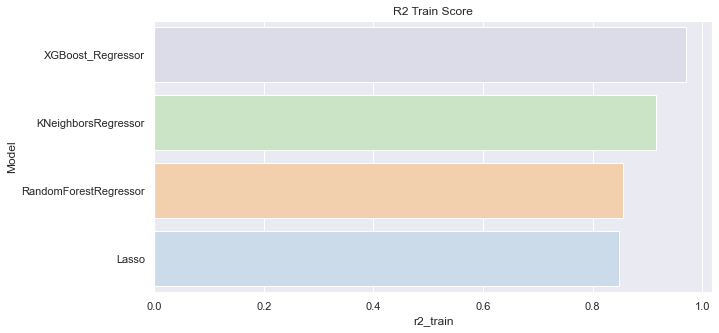

In [306]:
# Show R2 score for the train set
plt.figure(figsize=(10, 5))
sns.barplot(data = model_results.sort_values(by ='r2_train', ascending = False), 
            x = 'r2_train', y = 'Model', palette = 'tab20c_r')
plt.title("R2 Train Score")
plt.show()

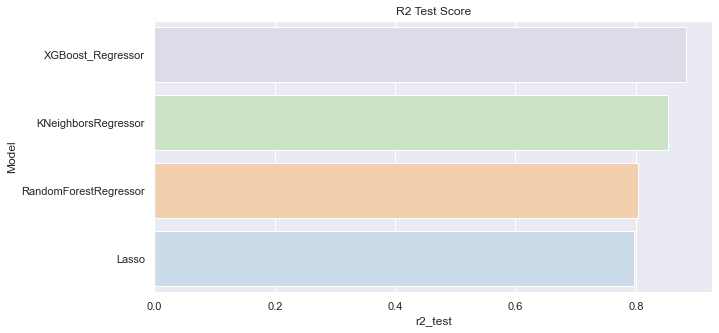

In [307]:
# Show R2 score for the test set
plt.figure(figsize=(10, 5))
sns.barplot(data = model_results.sort_values(by ='r2_test', ascending = False), 
            x = 'r2_test', y = 'Model', palette = 'tab20c_r')
plt.title("R2 Test Score")
plt.show()

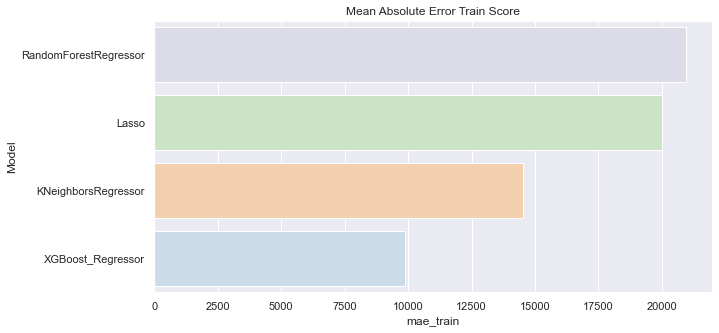

In [308]:
# Show MAE score for the train set
plt.figure(figsize=(10, 5))
sns.barplot(data = model_results.sort_values(by ='mae_train', ascending = False), 
            x = 'mae_train', y = 'Model', palette = 'tab20c_r')
plt.title("Mean Absolute Error Train Score")
plt.show()

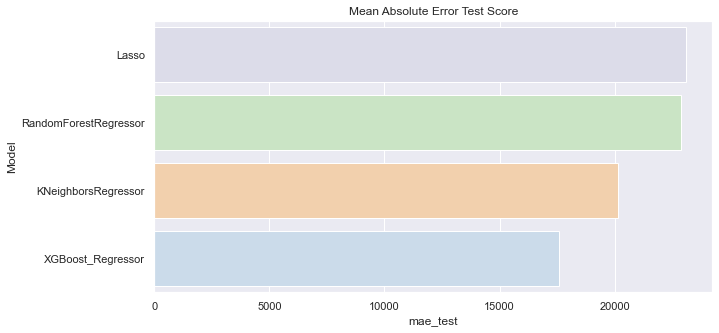

In [309]:
# Show MAE score for the test set
plt.figure(figsize=(10, 5))
sns.barplot(data = model_results.sort_values(by ='mae_test', ascending = False), 
            x = 'mae_test', y = 'Model', palette = 'tab20c_r')
plt.title("Mean Absolute Error Test Score")
plt.show()

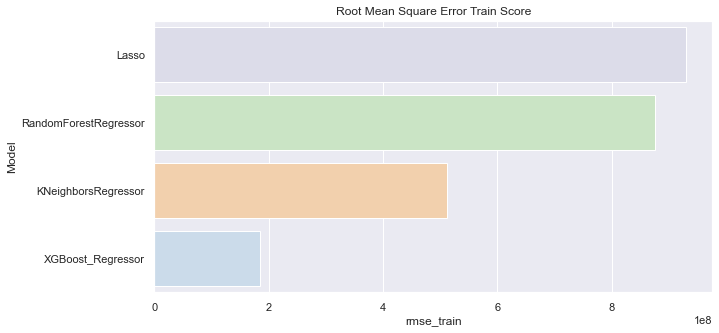

In [310]:
# Show RMSE score for the train set
plt.figure(figsize=(10, 5))
sns.barplot(data = model_results.sort_values(by ='rmse_train', ascending = False), 
            x = 'rmse_train', y = 'Model', palette = 'tab20c_r')
plt.title("Root Mean Square Error Train Score")
plt.show()

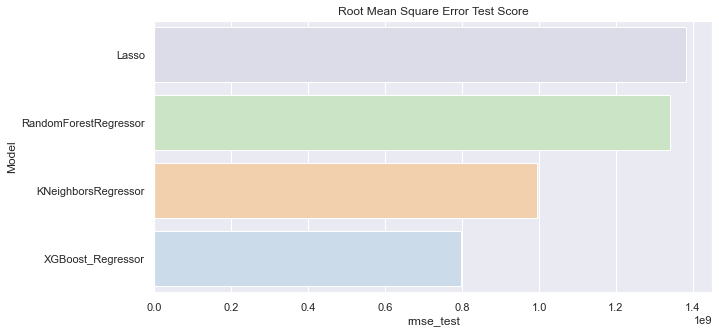

In [311]:
# Show RMSE score for the test set
plt.figure(figsize=(10, 5))
sns.barplot(data = model_results.sort_values(by ='rmse_test', ascending = False), 
            x = 'rmse_test', y = 'Model', palette = 'tab20c_r')
plt.title("Root Mean Square Error Test Score")
plt.show()

## 9.  Conclusion

Worked 30 hours for 3 weeks as a data scientist and developed regression models and evaluated results. Data Analysis included using different analysing techniques, fact-checking, extracting new data, patterns & data visualisation,feature engineering, building pipelines and final evaluation & reporting.
- First, I used different analysing techniques to see the relationship between features to the target. 
- Second, I extracted new data to see some patterns in the feature engineering part through merging variables and creating new factors.
- Third, in this work, I put my efforts to visualise all of my findings in the 'EDA' and 'Feature Engineering' parts.
- Fourth, I used pipelines and grid search to tune models' hyperparameters and find the best estimators for them.
- Fifth, I added four different types of regression metrics and also used a MAE, R2. RMSE matrix to evaluate models performances.

In this regression task I used XGBoost_Regressor, KNeighborsRegressor, RandomForestRegressor, Lasso. XGBoost_Regressor (train 0.970, test 0.883) showed the better score in R2 compared with other models. In the pipeline, I added imputation methods, encoding methods, scaling methods (for some) and additionally added functions to drop constant, duplicated and correlated features (though, eventually I ended up keeping only a few factors, I decided not to delete and keep these functions).    

I hope that my work will help you and perhaps answer some of your questions. I tried to comment on each line of the code, describe all graphs and even add some comments after each analytical and feature engineering part for your convenience. Please like and leave a comment if you liked my work. And I wish each and everyone of you [Happy Coding]. 

--------------------------------------------------------------------------------------------------Thank you!-------------------------------------------------------------------------------------------------
